In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import sklearn as sk
import joblib
#from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score,cross_validate
import timeit


In [2]:
random_seed = 108
test_size = 0.2

In [3]:

score_df = pd.DataFrame.from_dict(
    {'model': [],
 'test_accuracy':[],
 'outcome':[],
    'fit_time':[],
    'score_time':[],
    'test_precision':[],
    'test_recall':[],
    'test_f1':[],
    'test_roc_auc':[]}
)


test_df = pd.DataFrame.from_dict(
    {'model': [],
    'accuracy':[],
     'precision':[],
     'recall':[],
     'f1_score':[],
     'auc':[],
     'outcome':[]})


scoring = {'accuracy': 'accuracy',
           'precision': 'precision',
           'recall': 'recall',
          'f1': 'f1',
          'roc_auc': 'roc_auc'}

In [4]:
orig_data = pd.read_csv('MASTER STEMI database 2010 - 2019.csv')

In [5]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler,MinMaxScaler
#from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.impute import SimpleImputer
import statsmodels.api as sm
from imblearn.over_sampling import SMOTENC
from imblearn.pipeline import Pipeline

In [6]:
from sklearn.metrics import accuracy_score,precision_score,recall_score,roc_auc_score,f1_score
def evaluate_model(model,X,y):
    yhat = model.predict(X)
    yhat_proba = model.predict_proba(X)
    result_dict = {}
    result_dict['accuracy'] = [accuracy_score(y,yhat)]
    result_dict['precision'] = [precision_score(y,yhat)]
    result_dict['recall'] = [recall_score(y,yhat)]
    result_dict['f1_score'] = [f1_score(y,yhat)]
    result_dict['auc'] = [roc_auc_score(y,yhat_proba[:,1])]
    
    df = pd.DataFrame.from_dict(result_dict)
    return df

In [7]:
cols = [
    'Age',
    'Sex (0 = Male, 1=Female)',
    'Height',
    'Weight',
    'BMI',
    'Hypertension', 
    'Hypercholesterolaemia',
    'Smoking History( 2= current, 1 = ex smoke, 0 = never)', 
    'Diabetes',
    'Family History',
    'Previous stent',
    'Coded Cuplrit Vessel (RCA = 1, LCx = 2, LAD = 3)',
    'TIMI flow pre', 
    'TIMI Flow post',
    'Rentrop Simplified',
    'Coded Treatment (1 = PCI, 2 = PTCA, 3 = emergent CABG, 4 = med)',
    'No. of stent',
    'Length of stent',
    'CTO in remote vessel',
    'Pre-Hospital Arrest',
    'GP IIb/IIIa inhibitor', 
    'Inotrope during case', 
    'Starting HR',
    'Starting SBP',
    'Arrhythmia during case', 
    'IABP/ECMO',
    'Time from onset to angio (Hrs)'
]

orig_data['LVEF FINAL'] = orig_data['LVEF FINAL'].replace([-55,-99],np.NaN)

orig_data["lvef_abnormal"] = [np.NaN if np.isnan(x) else 1 if x < 40 else 0 for x in orig_data['LVEF FINAL']]

predictors = ["lvef_abnormal",'In-Hospital Mortality','ICU admission']

df = orig_data[cols + predictors]

In [8]:
df = df.replace([-55,-99],np.NaN)

for c in df.columns:
    df[c] = df[c].replace('', np.NaN)
    df[c] = df[c].replace('-', np.NaN)
    df[c] = df[c].replace('[a-zA-Z]+', np.NaN).astype(float)
    
df["Height"] = df["Height"].replace(0,np.NaN)
df["Age"] = df["Age"].where(df.Age.between(16, 105)) # remove ages less than 16 and greater than 105

df['Time from onset to angio (Hrs)'] = df['Time from onset to angio (Hrs)'].where(df['Time from onset to angio (Hrs)'] >= 0) 

In [9]:
df.isna().sum().sort_values()

Age                                                                  0
Pre-Hospital Arrest                                                  0
CTO in remote vessel                                                 0
No. of stent                                                         0
Coded Treatment (1 = PCI, 2 = PTCA, 3 = emergent CABG, 4 = med)      0
In-Hospital Mortality                                                0
TIMI Flow post                                                       0
TIMI flow pre                                                        0
Coded Cuplrit Vessel (RCA = 1, LCx = 2, LAD = 3)                     0
Rentrop Simplified                                                   0
Sex (0 = Male, 1=Female)                                             0
Arrhythmia during case                                               3
Inotrope during case                                                 3
Starting HR                                                         12
Weight

In [10]:
df["log_length_stent"] = np.log(df['Length of stent'])
df["log_onset_to_angio"] = np.log(df['Time from onset to angio (Hrs)'])
df.drop(['Length of stent','Time from onset to angio (Hrs)'],axis = 1,inplace=True)

In [11]:
df_subset_index = {}
for p in predictors:
    df_subset_index[p] = df.index[df[p].notna()].tolist()

In [12]:
float_col = [
    'Age',
    'Height',
    'Weight',
    'BMI',
    #'Length of stent',
    'log_length_stent',
    'Starting HR',
    'Starting SBP',
    #'Time from onset to angio (Hrs)',
    'log_onset_to_angio',
    'No. of stent'
]
categorical_col = [c for c in df.columns if c not in float_col + predictors]

In [13]:
df_dummy =  pd.get_dummies(
        df,
        columns = categorical_col, 
        dummy_na=False,
        drop_first=True)

In [14]:
df_dummy.columns
df_dummy_cat_cols = [x for x in df_dummy.columns if x not in float_col + predictors]

In [15]:
from sklearn.model_selection import train_test_split

train,test = {},{}
for p in predictors:
    train[p],test[p]= train_test_split(df_subset_index[p], test_size=test_size, random_state=random_seed)


In [17]:
    y_train = df_dummy.loc[train[p],p]
    X_train = df_dummy.iloc[train[p]].drop(predictors, axis=1)

In [21]:
pd.DataFrame(columns=X_train.columns).to_csv("app/dataframe_template.csv").loc[0,'age']

In [25]:
k = pd.DataFrame(columns=X_train.columns)
k.loc[0,'Age'] = 10

In [26]:
k

,Age,Height,Weight,BMI,No. of stent,Starting HR,Starting SBP,log_length_stent,log_onset_to_angio,"Sex (0 = Male, 1=Female)_1.0",...,Rentrop Simplified_1.0,"Coded Treatment (1 = PCI, 2 = PTCA, 3 = emergent CABG, 4 = med)_2.0","Coded Treatment (1 = PCI, 2 = PTCA, 3 = emergent CABG, 4 = med)_3.0","Coded Treatment (1 = PCI, 2 = PTCA, 3 = emergent CABG, 4 = med)_4.0",CTO in remote vessel_1.0,Pre-Hospital Arrest_1.0,GP IIb/IIIa inhibitor_1.0,Inotrope during case_1.0,Arrhythmia during case_1.0,IABP/ECMO_1.0
0,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
X_train.columns

Index(['Age', 'Height', 'Weight', 'BMI', 'No. of stent', 'Starting HR',
       'Starting SBP', 'log_length_stent', 'log_onset_to_angio',
       'Sex (0 = Male, 1=Female)_1.0', 'Hypertension_1.0',
       'Hypercholesterolaemia_1.0',
       'Smoking History( 2= current, 1 = ex smoke, 0 = never)_1.0',
       'Smoking History( 2= current, 1 = ex smoke, 0 = never)_2.0',
       'Diabetes_1.0', 'Family History_1.0', 'Previous stent_1.0',
       'Coded Cuplrit Vessel (RCA = 1, LCx = 2, LAD = 3)_2.0',
       'Coded Cuplrit Vessel (RCA = 1, LCx = 2, LAD = 3)_3.0',
       'TIMI flow pre_1.0', 'TIMI flow pre_2.0', 'TIMI flow pre_3.0',
       'TIMI Flow post_1.0', 'TIMI Flow post_2.0', 'TIMI Flow post_3.0',
       'Rentrop Simplified_1.0',
       'Coded Treatment (1 = PCI, 2 = PTCA, 3 = emergent CABG, 4 = med)_2.0',
       'Coded Treatment (1 = PCI, 2 = PTCA, 3 = emergent CABG, 4 = med)_3.0',
       'Coded Treatment (1 = PCI, 2 = PTCA, 3 = emergent CABG, 4 = med)_4.0',
       'CTO in remote vessel_

# Exploration

In [16]:
df.groupby(predictors).size().unstack(fill_value=0)

ICU admission                         0.0  1.0
lvef_abnormal In-Hospital Mortality           
0.0           0.0                    1244  117
              1.0                       4   34
1.0           0.0                     239   59
              1.0                       9   60

In [17]:
for p in predictors:
    print(df[p].value_counts(normalize=True))

lvef_abnormal
0.0    0.791853
1.0    0.208147
Name: proportion, dtype: float64
In-Hospital Mortality
0.0    0.931294
1.0    0.068706
Name: proportion, dtype: float64
ICU admission
0.0    0.840959
1.0    0.159041
Name: proportion, dtype: float64


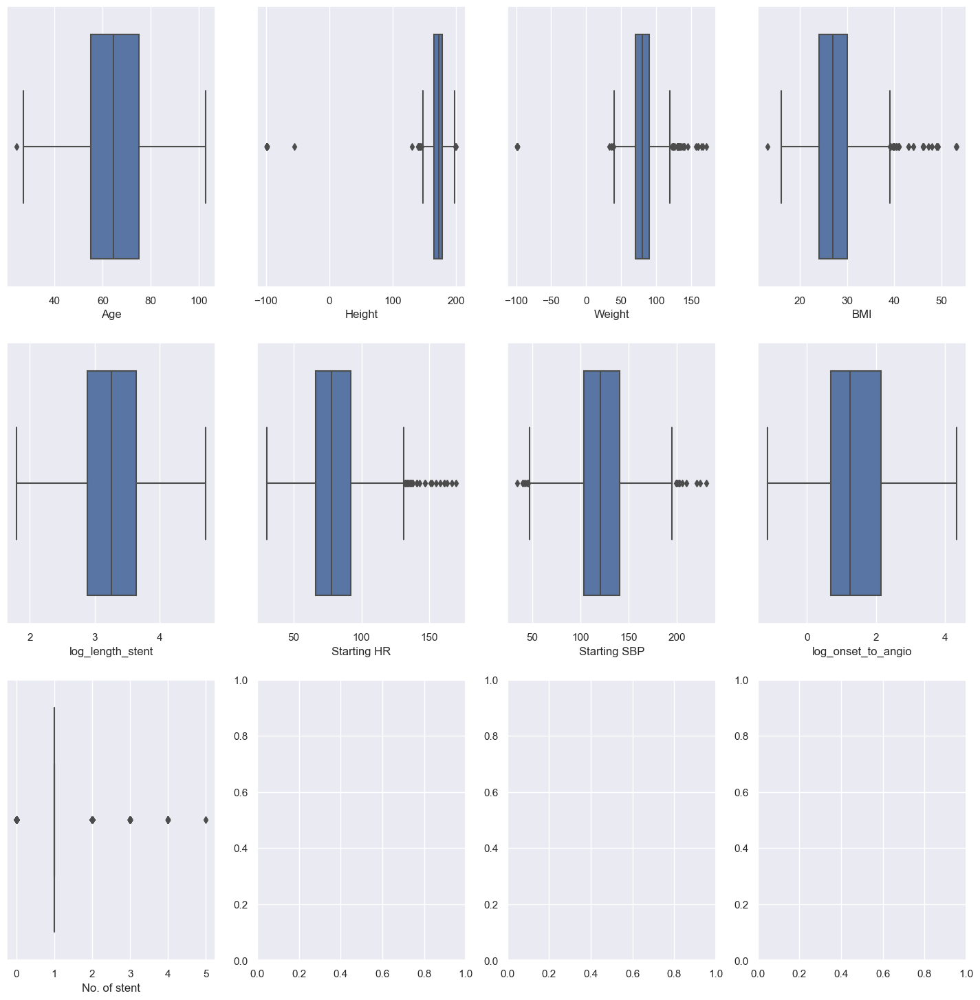

In [18]:
fig, axes = plt.subplots(3, 4, figsize=(18, 18))
i = 0
for c in float_col:
    sns.boxplot(ax=axes[int(i/4), i%4], data=df, x=c)
    i+=1

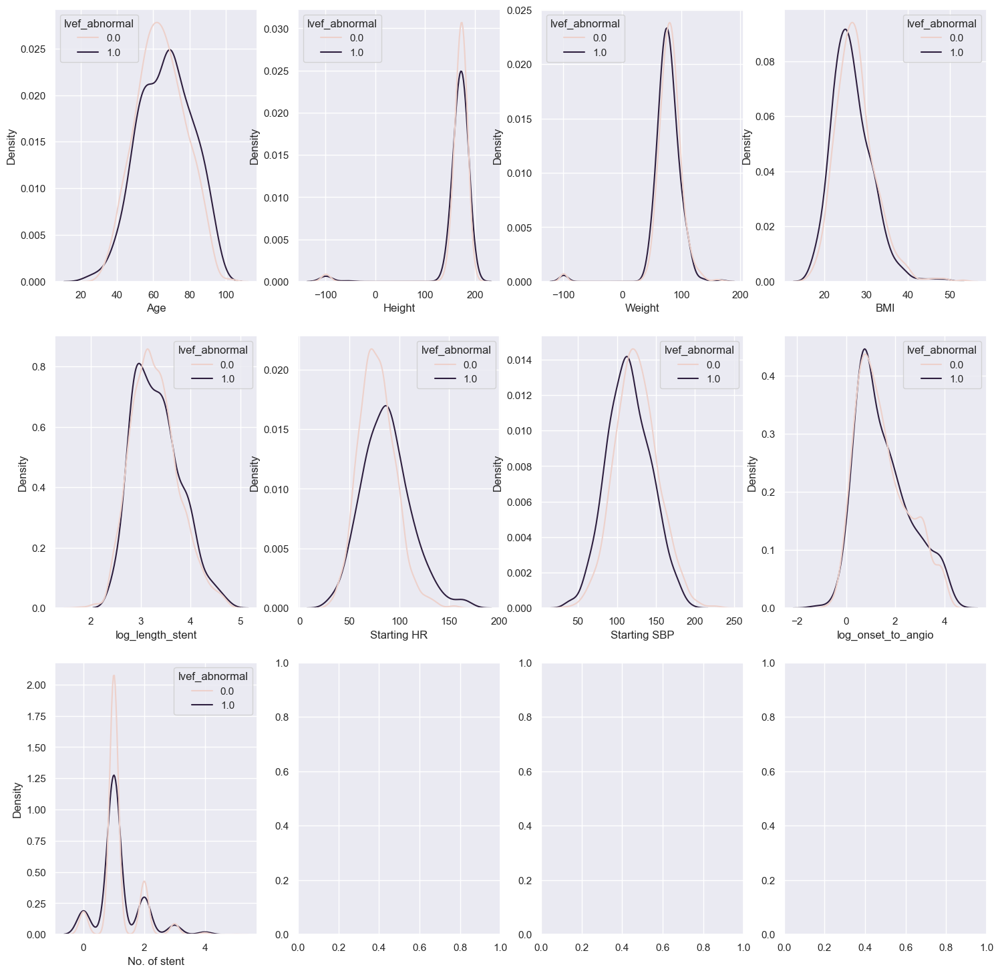

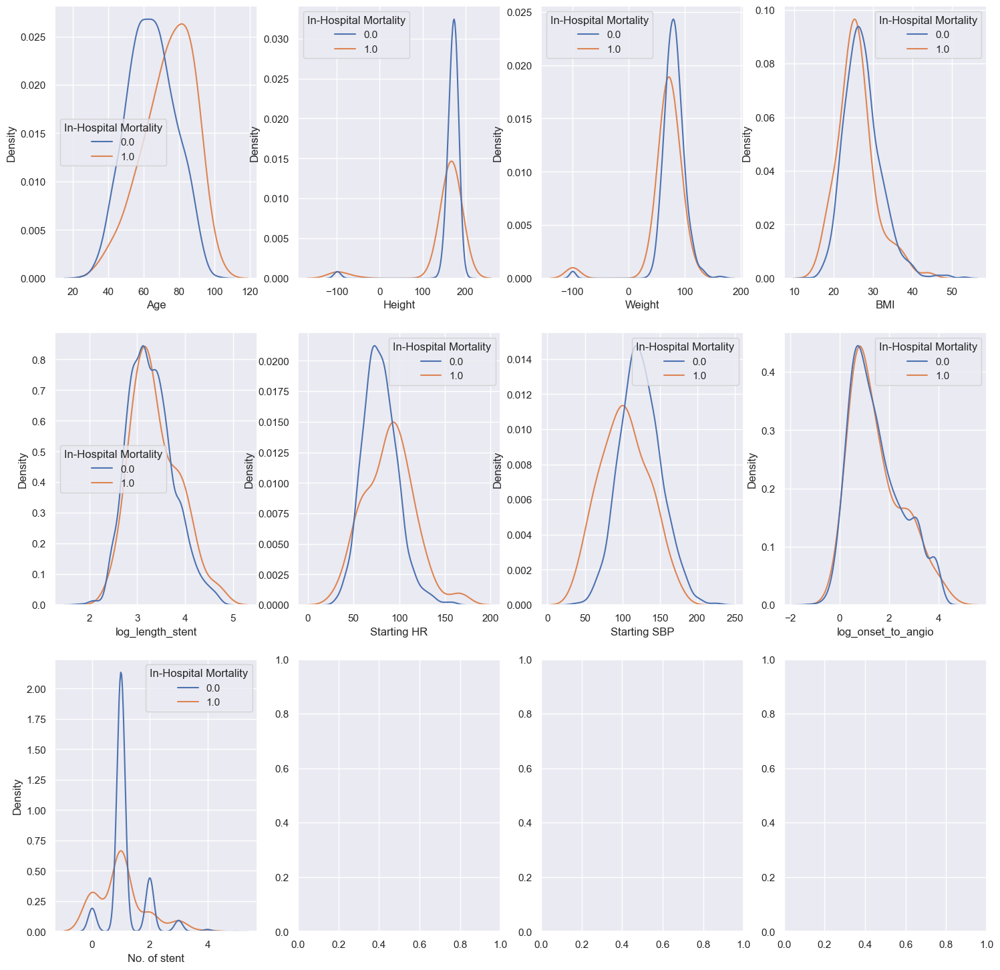

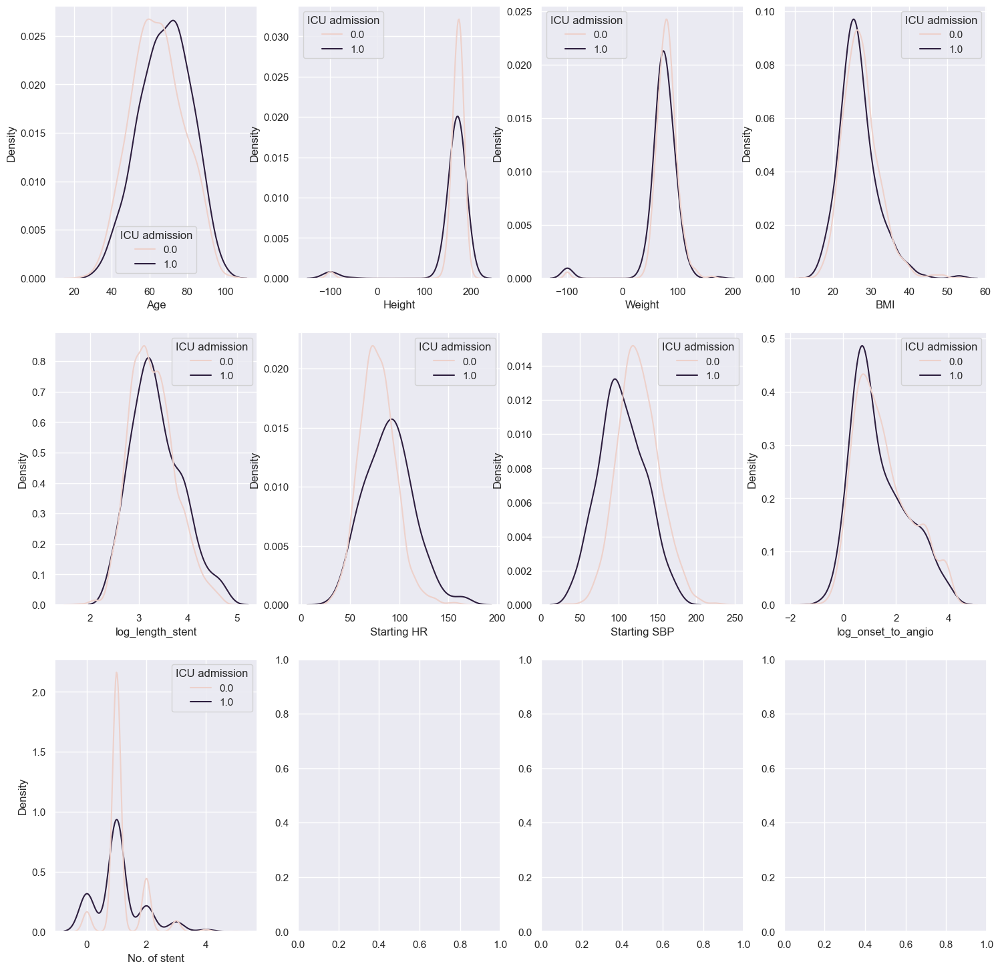

In [19]:
for p in predictors:
    fig, axes = plt.subplots(3, 4, figsize=(18, 18))
    i = 0
    for c in float_col:
        sns.kdeplot(ax=axes[int(i/4), i%4], data=df, x=c,hue=p,common_norm=False)
        i+=1

Possible significant features for `lvef_abnormal`
- length of stent
- starting HR
- starting SBP

Possible significant features for `In Hospital Mortality`
- Age
- starting HR
- starting SBP

Possible significant features for `ICU Admission`
- starting HR
- starting SBP

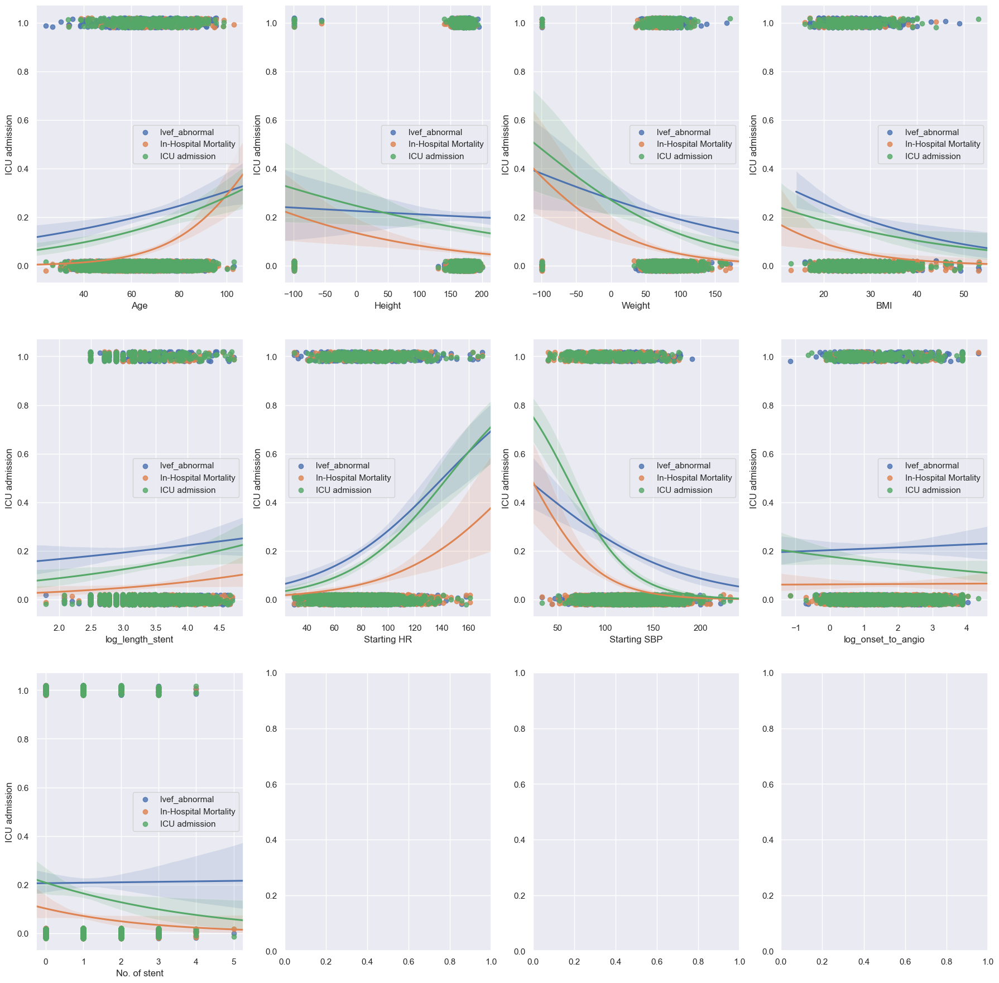

In [20]:
fig, axes = plt.subplots(3, 4, figsize=(22, 22))
i = 0
for c in float_col:
    for p in predictors:
        ax = sns.regplot(x=c, y=p, data=df,y_jitter=.02, 
                   logistic=True, truncate=False,ax=axes[int(i/4), i%4],label=p)
        ax.legend()
    i+=1

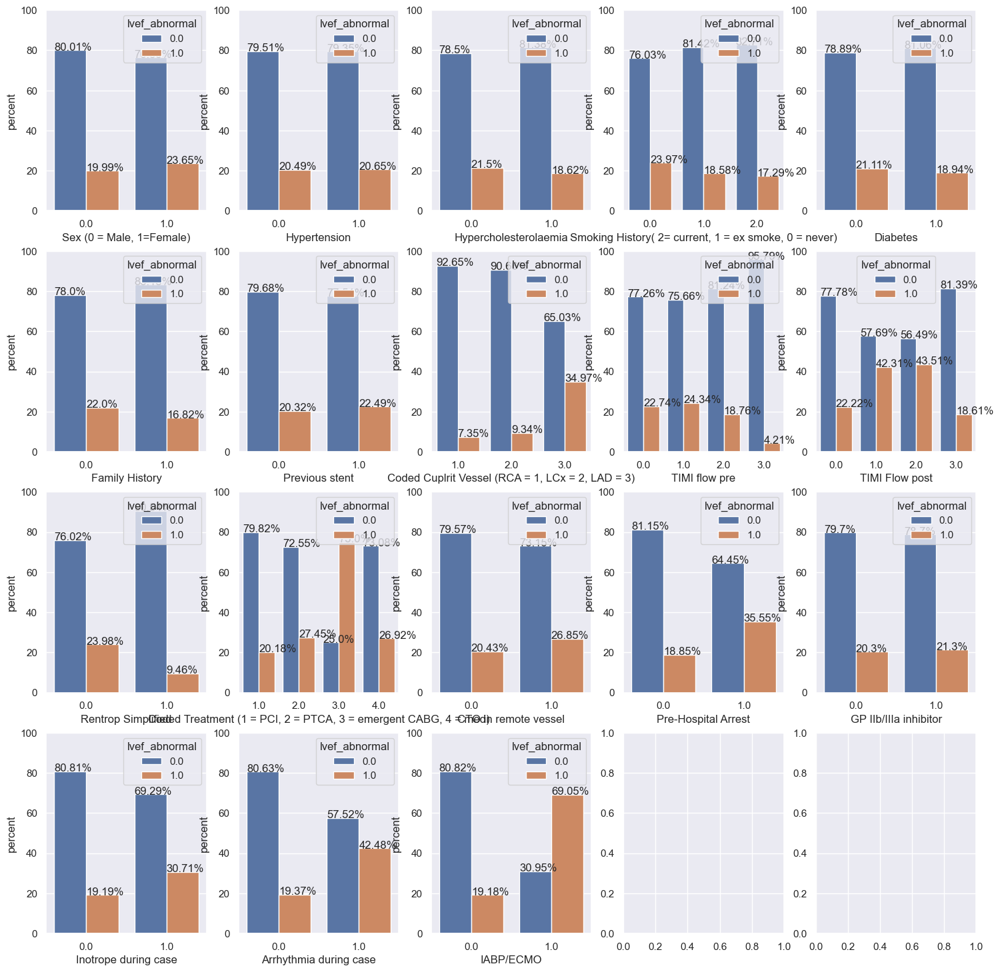

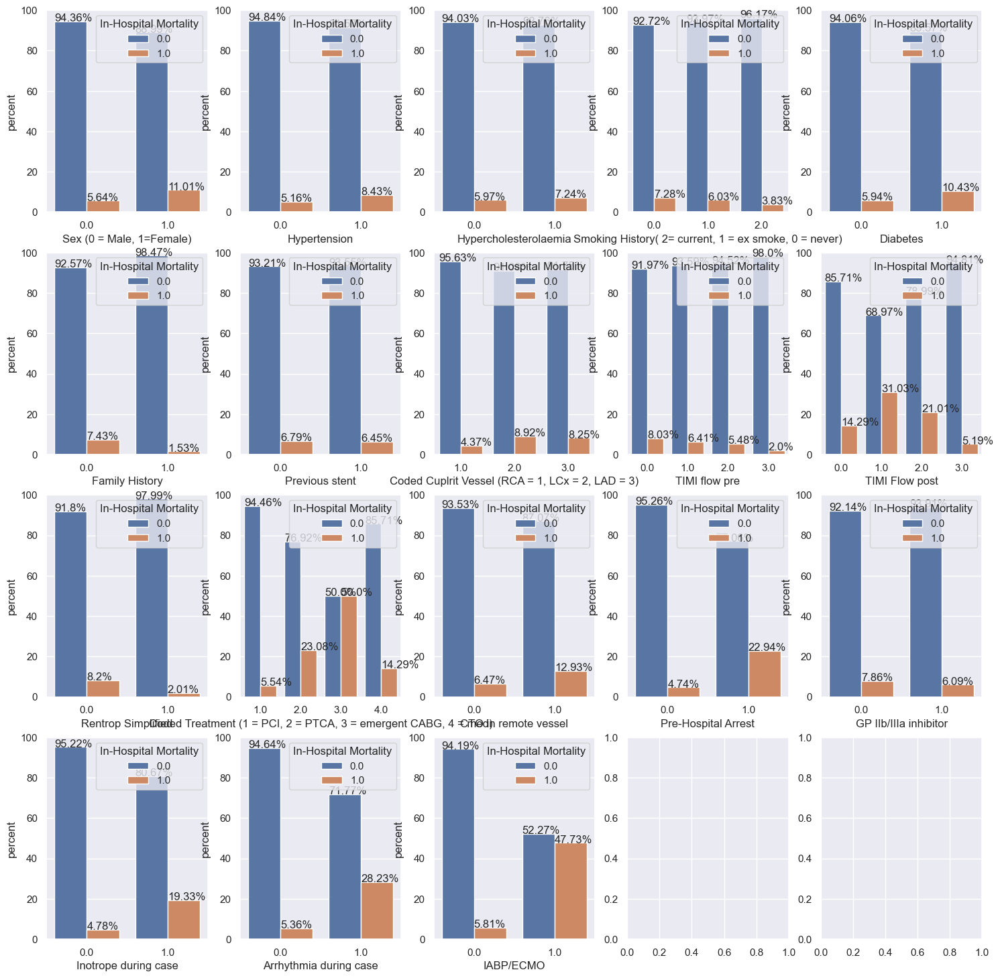

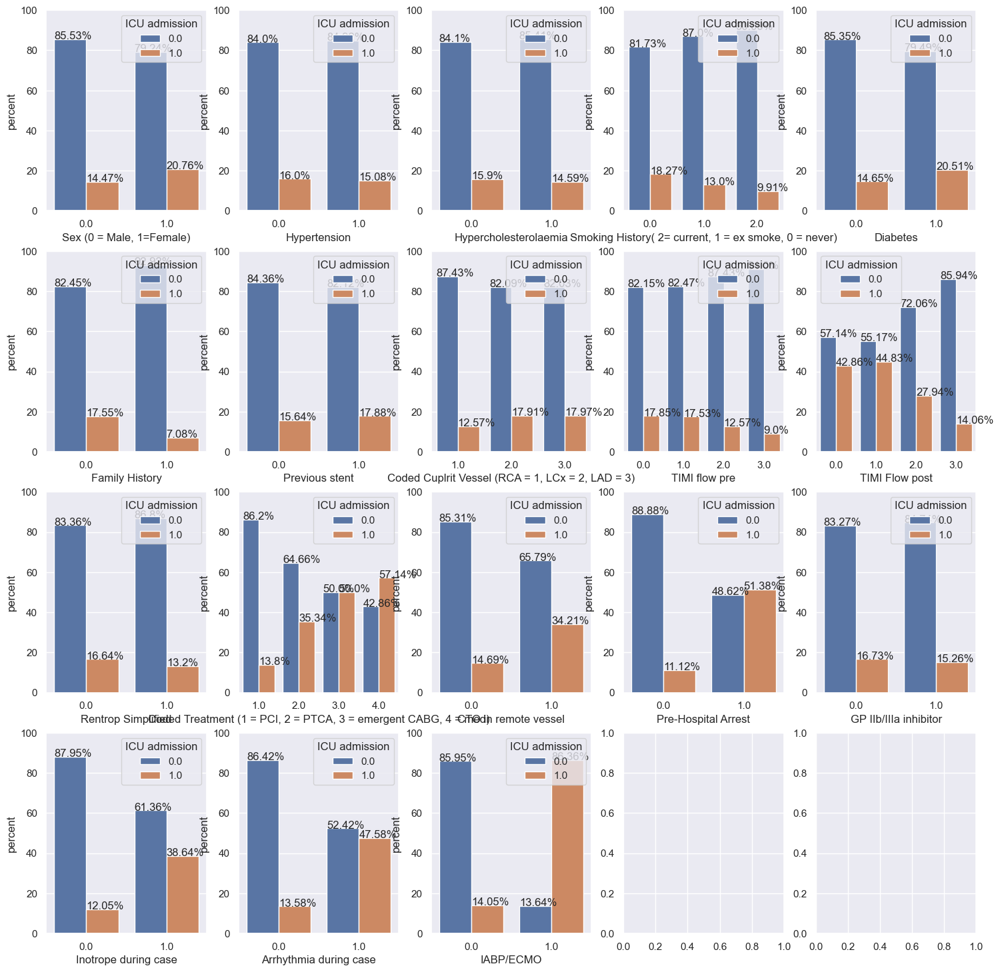

In [21]:
for pred in predictors:

    fig, axes = plt.subplots(4, 5, figsize=(18, 18))
    i = 0
    for c in categorical_col:
        x,y = c, pred
        df1 = df.groupby(x)[y].value_counts(normalize=True)
        df1 = df1.mul(100)
        df1 = df1.rename('percent').reset_index()

        g = sns.barplot(x=x,y='percent',hue=y,data=df1,ax=axes[int(i/5), i%5])
        g.set_ylim(0,100)

        for p in g.patches:
            txt = str(p.get_height().round(2)) + '%'
            txt_x = p.get_x() 
            txt_y = p.get_height()
            g.text(txt_x,txt_y,txt)
        i+=1


Possible significant features for `lvef_abnormal`
- Coded Culprit Vessel
- TIMI Flow post
- Coded Treatment
- Number of stent
- CTO in remote vessel
- Pre-hospital Arrest
- Inotrope during case
- Arrythmia during case
- IABP/ECMO

Possible significant features for `In-hospital Mortality` and `ICU Admission`
- Female
- Smoking History
- Diabetes
- Family History
- Coded Culprit Vessel
- TIMI Flow Pre
- TIMI Flow post
- Rentrop Simplified
- Number of stent
- CTO in remote vessel
- Pre-hospital Arrest
- Inotrope during case
- Arrythmia during case
- IABP/ECMO

Possible significant features for `lvef_abnormal`
- Female
- Smoking History
- Diabetes
- Family History
- Coded Culprit Vessel
- TIMI Flow Pre
- TIMI Flow post
- Rentrop Simplified
- Number of stent
- CTO in remote vessel
- Pre-hospital Arrest
- Inotrope during case
- Arrythmia during case
- IABP/ECMO


### train test split

In [35]:
scoring_method = 'roc_auc'
cv_result_filename = "result/outcome.csv"
test_result_filename = "result/test_result.csv"

# Model Building

In [23]:
def train_model(X,y,y_name,model,model_name,
                impute=True,
                scale=True,
                oversample=False,
                feature_select=None,
                categorical_features=None,
               score_method='accuracy'):
    pipeline_steps = []
    
    if impute:
        pipeline_steps.append( ('imputer',SimpleImputer(missing_values=np.nan, strategy='median')))
        
    if scale:
        pipeline_steps.append(  ('scaler',StandardScaler()))
    
    if oversample:
        cat_col_index = [i for i, x in enumerate(X.columns) if x in df_dummy_cat_cols]
        pipeline_steps.append(("sampler",SMOTENC(categorical_features=cat_col_index, random_state=random_seed)))
        model_name += '_oversample'
            
    if feature_select is not None:
         pipeline_steps.append(("feature_select",feature_select))
        
    
    pipeline_steps.append(  ('model',model))
    
    pipe = Pipeline(steps = pipeline_steps)
    
    cv_result = cross_validate(pipe, X, y, cv=5,scoring=scoring)
    
    results = [{k : v.mean() for k, v in cv_result.items()}]
    

    df_cv_result = pd.DataFrame(results, index=[model_name])
    df_cv_result["outcome"] = y_name
    df_cv_result["model"] = model_name

    
    pipe.fit(X,y)
    joblib.dump(pipe,"model/" + model_name + "_" + y_name +".pickle")
    
    
    return pipe,df_cv_result

In [24]:
def plot_coef(model,model_name,columns):
    
    if "feature_select" in model.named_steps:
        feature_select = model.named_steps["feature_select"].support_
        columns = columns[feature_select]
        
    coefs = model.named_steps["model"].coef_
    coef_df = pd.DataFrame(data = {'variable' : columns,
                          'value' : coefs[0],
                           'mag':   coefs[0]    })

    coef_df = coef_df.sort_values('mag', ascending=False)
    plt.figure(figsize=(18, 18))
    ax = sns.barplot(
        data=coef_df, x="variable", y="mag")
    ax.set_title("Coefficient for " + p)
    plt.setp(ax.get_xticklabels(), rotation=90)

    plt.savefig("figure/" + model_name + "_" +p+".png",bbox_inches="tight")
    return ax

## Baseline model
No feature selection

In [36]:
#score_df = pd.read_csv("result/outcome.csv",index_col=0)
score_df = pd.read_csv(cv_result_filename,index_col=0)
test_df = pd.read_csv(test_result_filename,index_col=0)

In [38]:
model_name = 'lr_baseline'
for p in predictors:
    y_train = df_dummy.loc[train[p],p]
    X_train = df_dummy.iloc[train[p]].drop(predictors, axis=1)
    
    model = LogisticRegression(penalty = None,max_iter = 10000)
    pipe,df_cv_result = train_model(X_train,y_train,p,model,model_name,score_method=scoring_method)
     
    score_df = pd.concat([score_df,df_cv_result],ignore_index=True)


In [39]:
for p in predictors:
    y_test = df_dummy.loc[train[p],p]
    X_test = df_dummy.iloc[train[p]].drop(predictors, axis=1)
    test_result_df = evaluate_model(pipe,X_test,y_test)
    test_result_df["outcome"] = p
    test_result_df["model"] = model_name
    
    test_df = pd.concat([test_df,test_result_df],ignore_index=True)

In [40]:
X_train.columns

Index(['Age', 'Height', 'Weight', 'BMI', 'No. of stent', 'Starting HR',
       'Starting SBP', 'log_length_stent', 'log_onset_to_angio',
       'Sex (0 = Male, 1=Female)_1.0', 'Hypertension_1.0',
       'Hypercholesterolaemia_1.0',
       'Smoking History( 2= current, 1 = ex smoke, 0 = never)_1.0',
       'Smoking History( 2= current, 1 = ex smoke, 0 = never)_2.0',
       'Diabetes_1.0', 'Family History_1.0', 'Previous stent_1.0',
       'Coded Cuplrit Vessel (RCA = 1, LCx = 2, LAD = 3)_2.0',
       'Coded Cuplrit Vessel (RCA = 1, LCx = 2, LAD = 3)_3.0',
       'TIMI flow pre_1.0', 'TIMI flow pre_2.0', 'TIMI flow pre_3.0',
       'TIMI Flow post_1.0', 'TIMI Flow post_2.0', 'TIMI Flow post_3.0',
       'Rentrop Simplified_1.0',
       'Coded Treatment (1 = PCI, 2 = PTCA, 3 = emergent CABG, 4 = med)_2.0',
       'Coded Treatment (1 = PCI, 2 = PTCA, 3 = emergent CABG, 4 = med)_3.0',
       'Coded Treatment (1 = PCI, 2 = PTCA, 3 = emergent CABG, 4 = med)_4.0',
       'CTO in remote vessel_

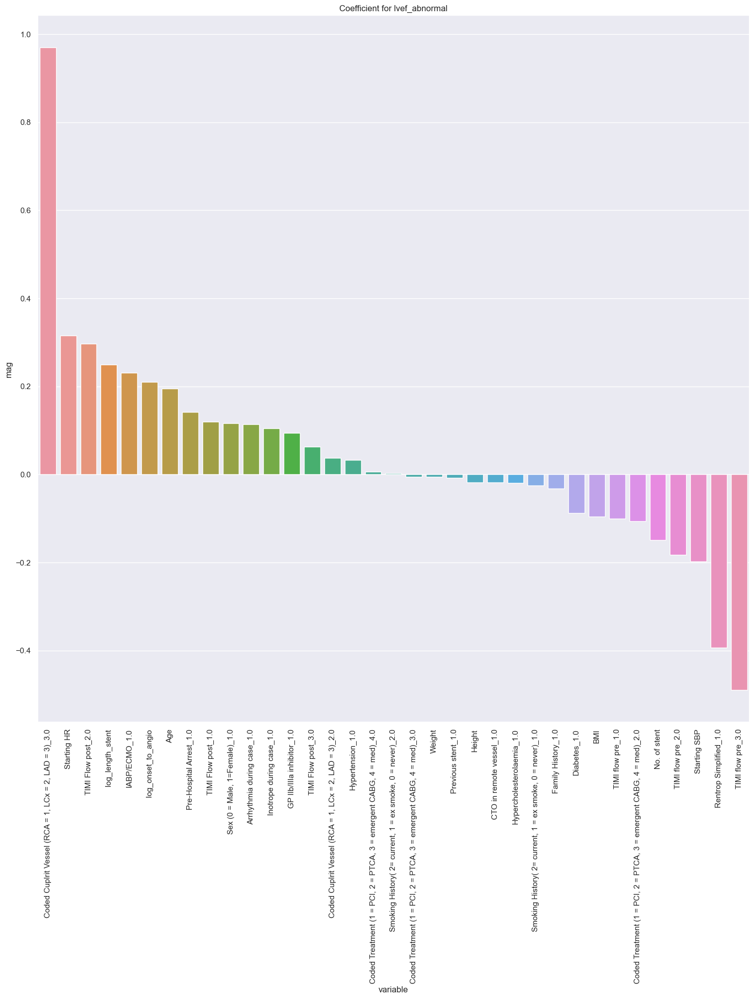

In [41]:
for p in predictors:
    pipe = joblib.load("model/" + model_name + "_" + p +".pickle")
    ax = plot_coef(pipe,model_name,X_train.columns)

In [42]:
score_df.to_csv(cv_result_filename)
test_df.to_csv(test_result_filename)

## l1 regression

In [43]:

pre_train_model = LogisticRegression(random_state=random_seed,max_iter = 5000,penalty = 'l1',n_jobs=4,solver = 'saga')
param_grid = {
    "logistic__C": np.logspace(1e-5,1e1,num=50)
}

for p in predictors:
    for use_oversample in [False,True]:
        y_train = df_dummy.loc[train[p],p]
        X_train = df_dummy.iloc[train[p]].drop(predictors, axis=1)
        model_name = 'l1_baseline'    
        cat_col_index = [i for i, x in enumerate(X_train.columns) if x in df_dummy_cat_cols]
        if use_oversample:
            pre_train_pipeline = [
                    ("imputer",SimpleImputer(missing_values=np.nan, strategy='median')),
                    ("sampler",SMOTENC(categorical_features=cat_col_index, random_state=random_seed)),
                    ("scaler", StandardScaler()), 
                    ("logistic", pre_train_model)
                ]
            model_name += "_oversample"
        else:
             pre_train_pipeline = [
                ("imputer",SimpleImputer(missing_values=np.nan, strategy='median')),
                ("scaler", StandardScaler()), 
                ("logistic", pre_train_model)
            ]

        pipeline = Pipeline(steps=pre_train_pipeline)

        grid = GridSearchCV(pipeline,
                        param_grid = param_grid,cv=10,scoring=scoring_method)


        grid.fit(X_train, y_train)
        joblib.dump(grid.best_estimator_,"model/" + model_name + "_"+p+".pickle")



## Logistic regression with feature selection

In [45]:
score_df = pd.read_csv(cv_result_filename,index_col=0)
test_df = pd.read_csv(test_result_filename,index_col=0)

In [46]:
n_features = [5,10,15,20,25,30]

In [47]:
for n in n_features:
    model_name = "logistic_feature_selection"
    model_name += str(n)
    for p in predictors:
        y_train = df_dummy.loc[train[p],p]
        X_train = df_dummy.iloc[train[p]].drop(predictors, axis=1)

        model = LogisticRegression(penalty = None,max_iter = 10000)
        feature_select_model =  SequentialFeatureSelector(LogisticRegression(max_iter = 1000,penalty = None),
                                       n_features_to_select=n,scoring=scoring_method)
        pipe,df_cv_result = train_model(
                                X_train,
                                y_train,
                                p,
                                model,
                                model_name,
                                feature_select=feature_select_model,
                                score_method=scoring_method,
                                oversample=True)


        score_df = pd.concat([score_df,df_cv_result],ignore_index=True)

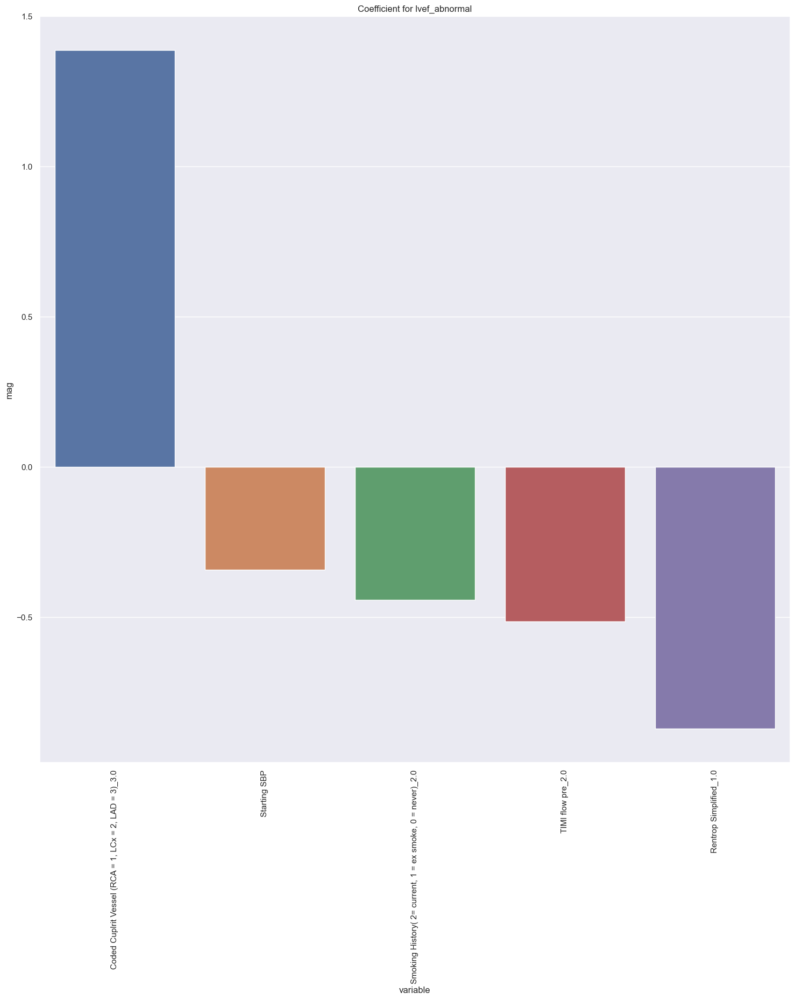

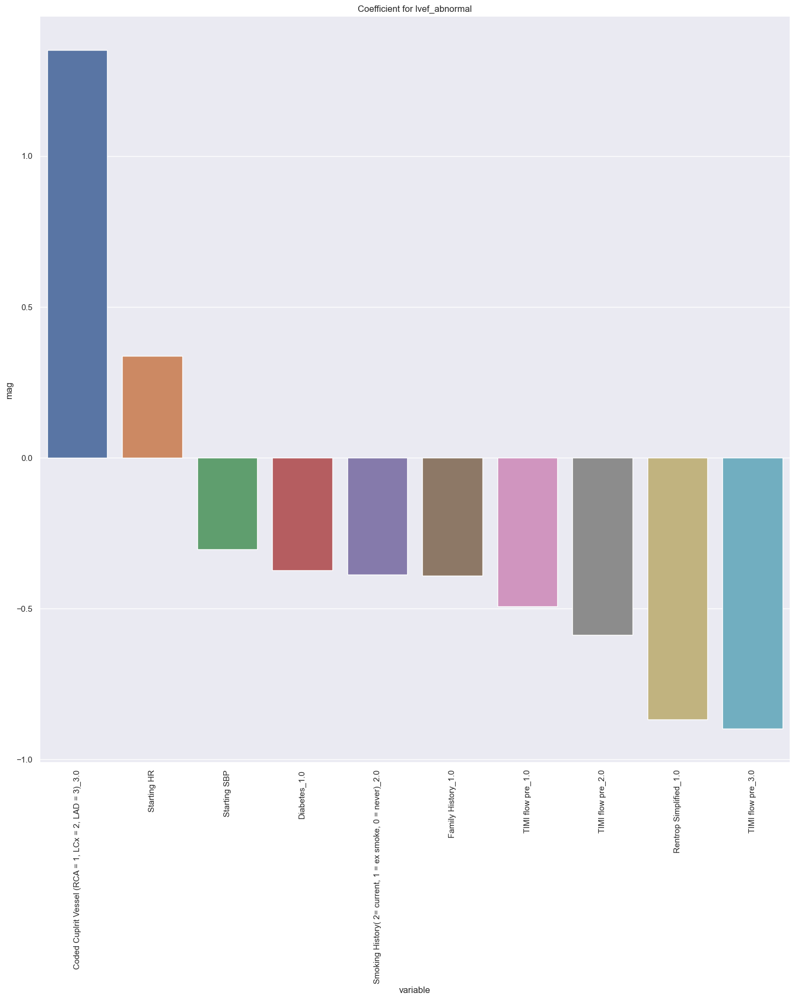

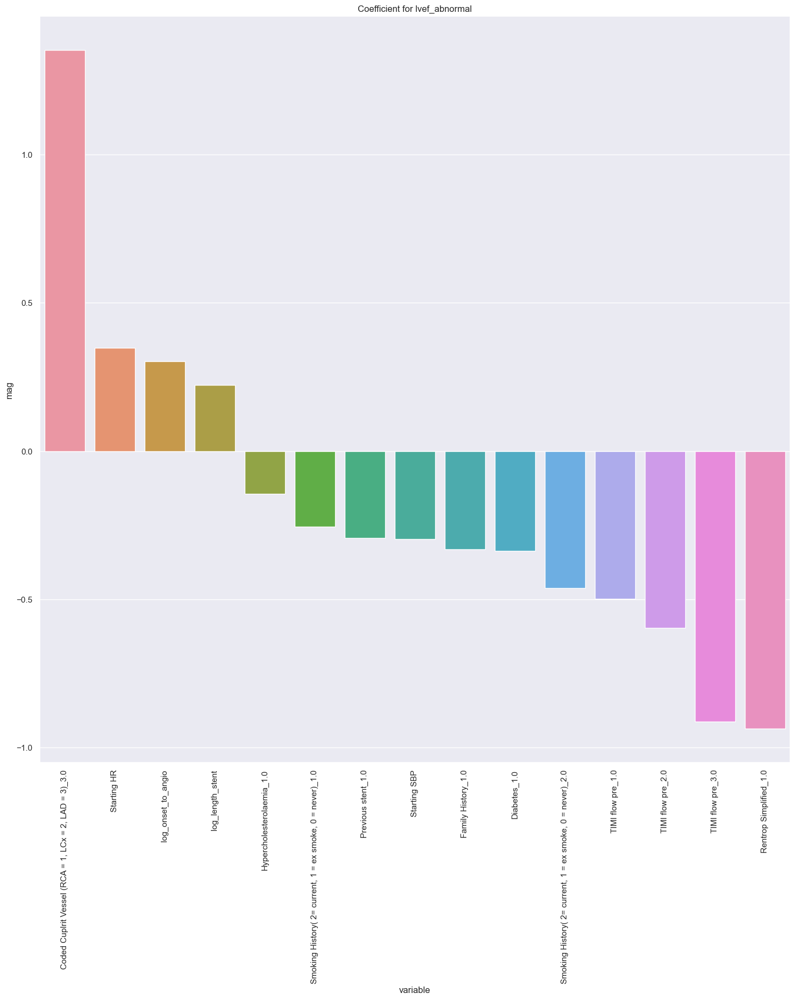

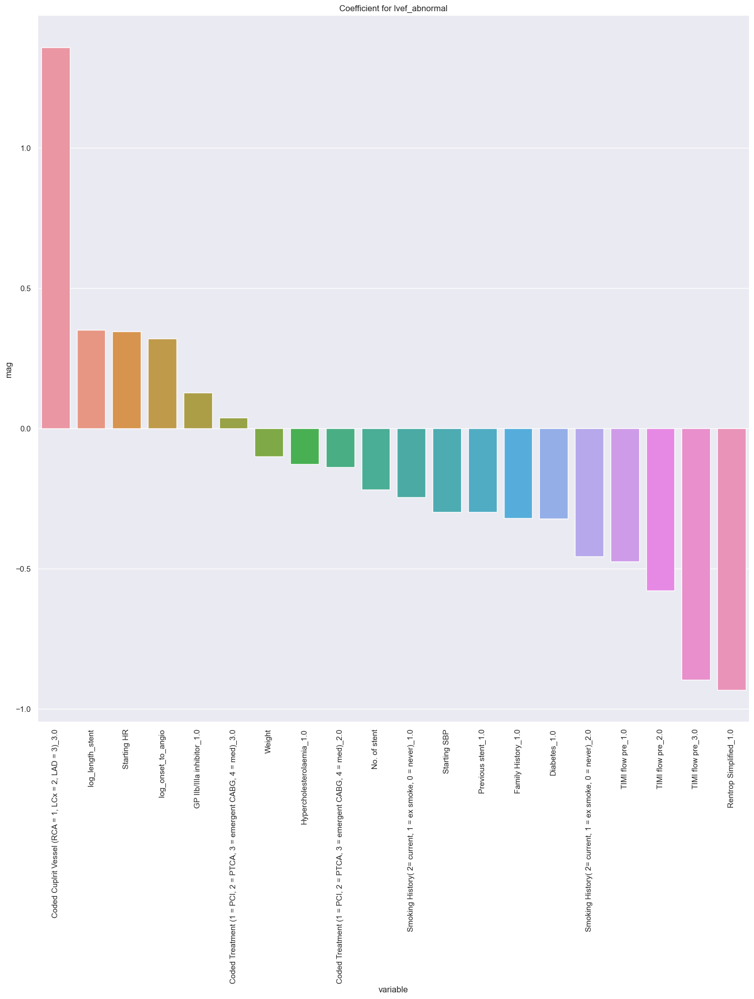

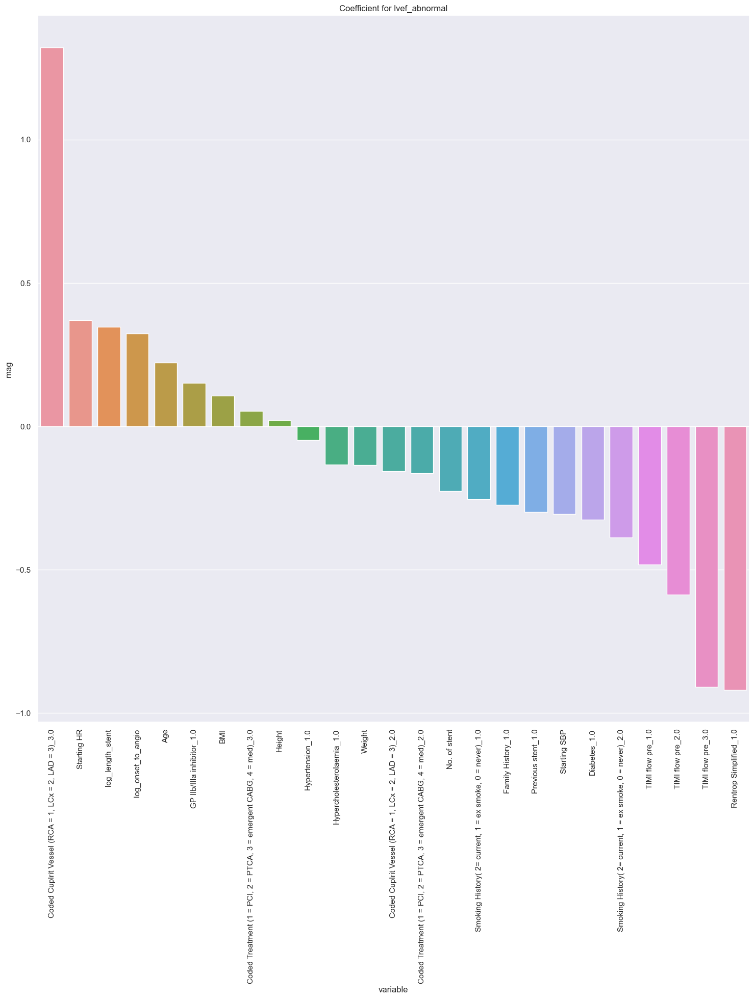

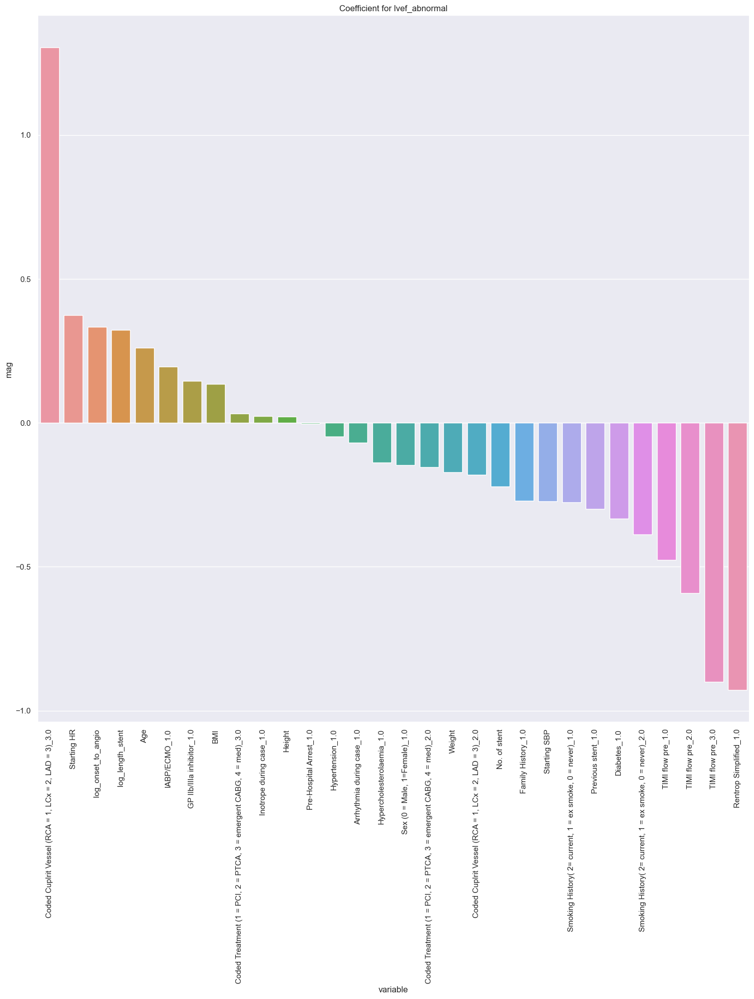

In [48]:
for n in n_features:
    model_name = "logistic_feature_selection"
    model_name += str(n)
    model_name+= '_oversample'
    for p in predictors:
        pipe = joblib.load("model/" + model_name + "_" + p +".pickle")
        ax = plot_coef(pipe,model_name,X_train.columns)

In [49]:
for n in n_features:
    model_name = "logistic_feature_selection"
    model_name += str(n)
    model_name+= '_oversample'
    for p in predictors:
        y_test = df_dummy.loc[test[p],p]
        X_test = df_dummy.iloc[test[p]].drop(predictors, axis=1)
        pipe = joblib.load("model/" + model_name + "_" + p +".pickle")
        test_result_df = evaluate_model(pipe,X_test,y_test)
        test_result_df["outcome"] = p
        test_result_df["model"] = model_name

        test_df = pd.concat([test_df,test_result_df],ignore_index=True)

In [50]:
score_df.to_csv(cv_result_filename )
test_df.to_csv(test_result_filename)

## L2 logistic regression

In [52]:
score_df = pd.read_csv(cv_result_filename ,index_col=0)
test_df = pd.read_csv(test_result_filename,index_col=0)

In [149]:
model_type = 'l1'
use_oversample = True

In [53]:
for model_type in ['l1','l2','elasticnet']:
    for n in n_features:
        for use_oversample in [False,True]:

            for p in predictors:
                print(model_type + " " + str(use_oversample) + " " + p + " " + str(n))
                start_time = timeit.default_timer()

                if model_type == 'l1':
                    pre_train_model = LogisticRegression(random_state=random_seed,max_iter = 5000,penalty = 'l1',n_jobs=4,solver = 'saga')
                    model_name = "l1_feature_selection" + str(n)
                    param_grid = {
                        "logistic__C": np.logspace(1e-3,1,num=10)
                    }
                elif model_type == 'l2':
                    pre_train_model = LogisticRegression(random_state=random_seed,max_iter = 1000,penalty = 'l2',n_jobs=4,solver = 'lbfgs')
                    model_name = "l2_feature_selection" + str(n)
                    param_grid = {
                        "logistic__C": np.logspace(1e-3,1,num=10)
                    }
                elif model_type == 'elasticnet':
                    pre_train_model = LogisticRegression(random_state=random_seed,max_iter = 5000,penalty='elasticnet',solver='saga') 
                    model_name = "elasticnet_feature_selection" + str(n)

                    param_grid = {
                        "logistic__C": np.linspace(1e-3,1,num=15),
                        "logistic__l1_ratio": np.linspace(1e-1,1,num=5)
                    }

                y_train = df_dummy.loc[train[p],p]
                X_train = df_dummy.iloc[train[p]].drop(predictors, axis=1)

                cat_col_index = [i for i, x in enumerate(X_train.columns) if x in df_dummy_cat_cols]

                if use_oversample:
                    pre_train_pipeline = [
                        ("imputer",SimpleImputer(missing_values=np.nan, strategy='median')),
                        ("sampler",SMOTENC(categorical_features=cat_col_index, random_state=random_seed)),
                        ("scaler", StandardScaler()), 
                        ("logistic", pre_train_model)
                    ]
                    model_name += "_oversample"
                else:
                     pre_train_pipeline = [
                        ("imputer",SimpleImputer(missing_values=np.nan, strategy='median')),
                        ("scaler", StandardScaler()), 
                        ("logistic", pre_train_model)
                    ]

                pipeline = Pipeline(steps=pre_train_pipeline)

                grid = GridSearchCV(pipeline,
                                param_grid = param_grid,cv=5,scoring=scoring_method)


                grid.fit(X_train, y_train)

                if model_type == 'l1':
                    model = LogisticRegression(max_iter = 1000,penalty = 'l1',C = grid.best_params_["logistic__C"],solver = 'saga')
                    feature_select_model =  SequentialFeatureSelector(LogisticRegression(max_iter = 1000,penalty = 'l1',
                                                                  C = grid.best_params_["logistic__C"],solver = 'saga'), 
                                               n_features_to_select=n,scoring=scoring_method)
                elif model_type == 'l2':
                    model = LogisticRegression(max_iter = 1000,penalty = 'l2',C = grid.best_params_["logistic__C"])
                    feature_select_model =   SequentialFeatureSelector(LogisticRegression(max_iter = 1000,penalty = 'l2',
                                                                  C = grid.best_params_["logistic__C"]), 
                                               n_features_to_select=n,scoring=scoring_method)
                elif model_type == 'elasticnet':
                    model = LogisticRegression(random_state=random_seed,
                                               max_iter = 5000,
                                               penalty='elasticnet',
                                               solver='saga', 
                                               C = grid.best_params_["logistic__C"],
                                              l1_ratio=grid.best_params_["logistic__l1_ratio"])
                    feature_select_model = SequentialFeatureSelector(
                         LogisticRegression(
                             random_state=random_seed,
                             max_iter = 5000,
                             penalty='elasticnet',
                             solver='saga',
                             C = grid.best_params_["logistic__C"],
                            l1_ratio=grid.best_params_["logistic__l1_ratio"]), 
                         n_features_to_select=n,scoring=scoring_method)



                pipe,df_cv_result = train_model(
                                        X_train,
                                        y_train,
                                        p,
                                        model,
                                        model_name,
                                        feature_select=feature_select_model,
                                        score_method=scoring_method,
                                        oversample=use_oversample
                                    )


                score_df = pd.concat([score_df,df_cv_result],ignore_index=True)
                elapsed = timeit.default_timer() - start_time
                print("time taken: ",elapsed)

l1 False lvef_abnormal 5
time taken:  28.117715300000327
l1 True lvef_abnormal 5
time taken:  49.39888719999999
l1 False lvef_abnormal 10
time taken:  46.7335978000001
l1 True lvef_abnormal 10
time taken:  74.89064619999999
l1 False lvef_abnormal 15
time taken:  67.61429130000033
l1 True lvef_abnormal 15
time taken:  102.50847320000003
l1 False lvef_abnormal 20
time taken:  92.73778300000004
l1 True lvef_abnormal 20
time taken:  139.9186205000001
l1 False lvef_abnormal 25
time taken:  128.8782430000001
l1 True lvef_abnormal 25
time taken:  205.1537629999998
l1 False lvef_abnormal 30
time taken:  168.59007329999986
l1 True lvef_abnormal 30
time taken:  252.6300857000001
l2 False lvef_abnormal 5
time taken:  24.37252660000013
l2 True lvef_abnormal 5
time taken:  38.62913430000026
l2 False lvef_abnormal 10
time taken:  33.54932749999989
l2 True lvef_abnormal 10
time taken:  55.905715599999894
l2 False lvef_abnormal 15
time taken:  46.2944978999999
l2 True lvef_abnormal 15
time taken:  70.

In [57]:
score_df

,model,test_accuracy,outcome,fit_time,score_time,test_precision,test_recall,test_f1,test_roc_auc
0,lr_baseline,0.958829,lvef_abnormal,0.017805,0.010602,0.613333,0.161538,0.240610,0.715484
1,lr_baseline,0.930872,In-Hospital Mortality,0.017404,0.010002,0.491429,0.250000,0.321319,0.854388
2,lr_baseline,0.869202,ICU admission,0.013803,0.010402,0.682736,0.366667,0.475193,0.822408
3,logistic_feature_selection5_oversample,0.769048,lvef_abnormal,3.837110,0.009802,0.079083,0.407692,0.132289,0.630730
4,logistic_feature_selection5_oversample,0.779866,In-Hospital Mortality,3.743333,0.010401,0.191968,0.710000,0.301497,0.827626
...,...,...,...,...,...,...,...,...,...
356,elasticnet_feature_selection20_oversample_over...,0.748798,lvef_abnormal,23.523950,0.013803,0.414113,0.619359,0.495710,0.773111
357,elasticnet_feature_selection25,0.812285,lvef_abnormal,27.476106,0.013003,0.609650,0.214580,0.315837,0.789249
358,elasticnet_feature_selection25_oversample_over...,0.750196,lvef_abnormal,29.589224,0.014803,0.416051,0.615910,0.495864,0.773492
359,elasticnet_feature_selection30,0.815082,lvef_abnormal,32.635401,0.013403,0.625861,0.224924,0.330045,0.790420


C:\Users\Harrison Nguyen\AppData\Local\Temp\ipykernel_15496\3185216317.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(18, 18))


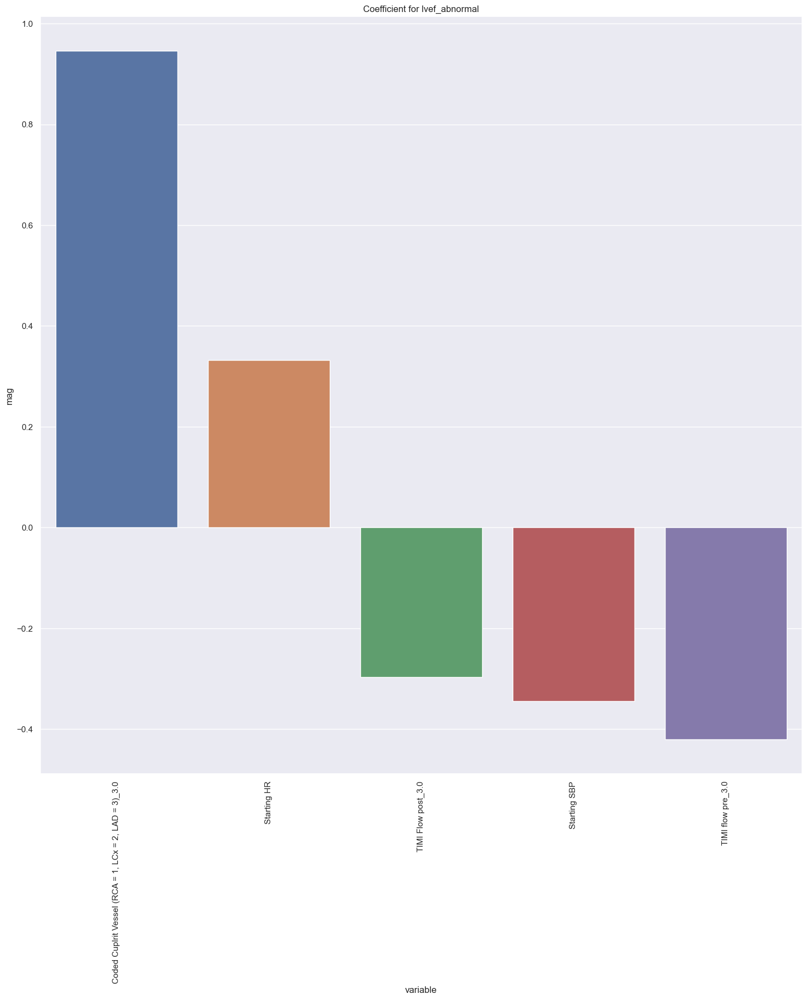

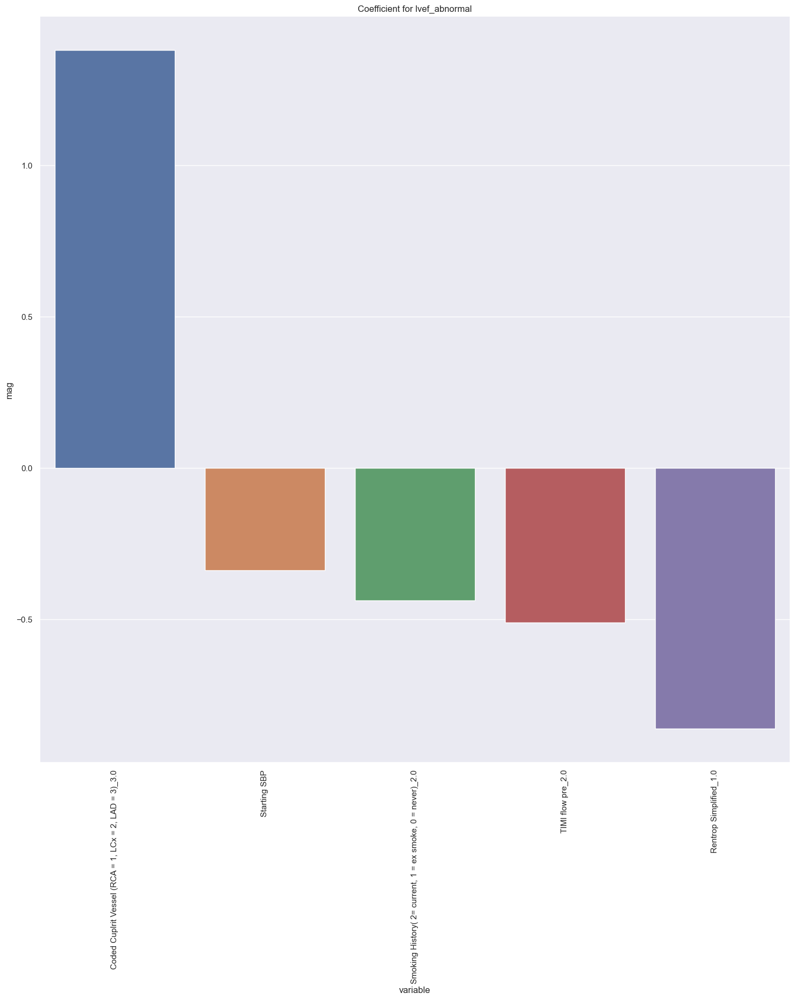

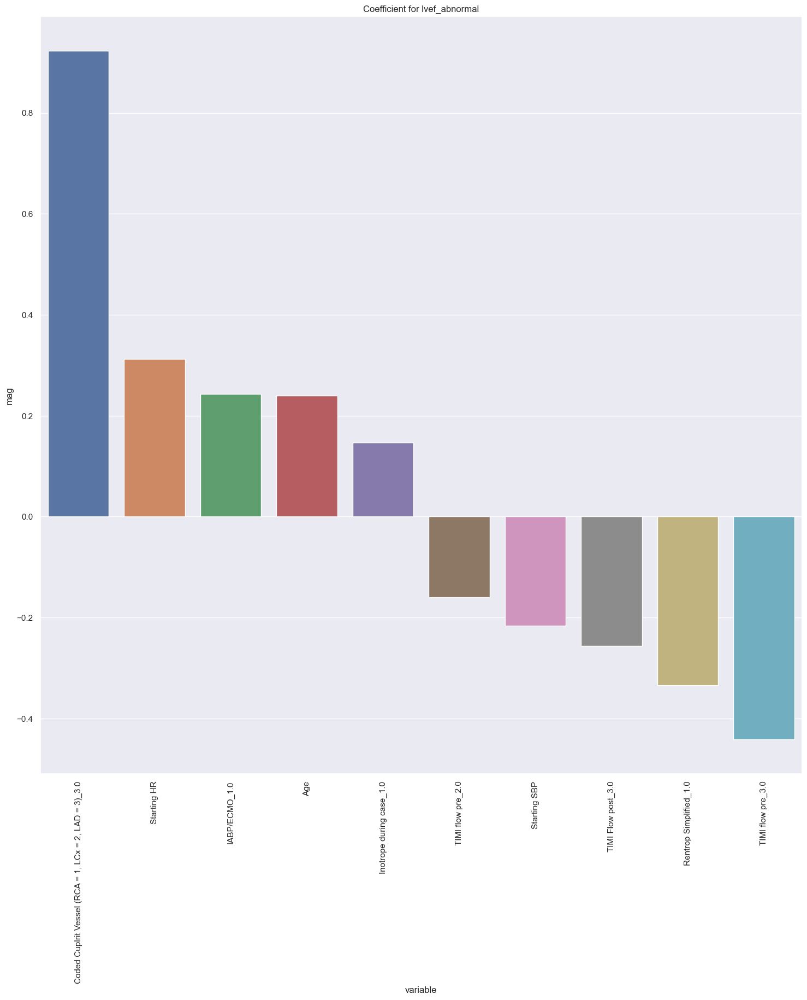

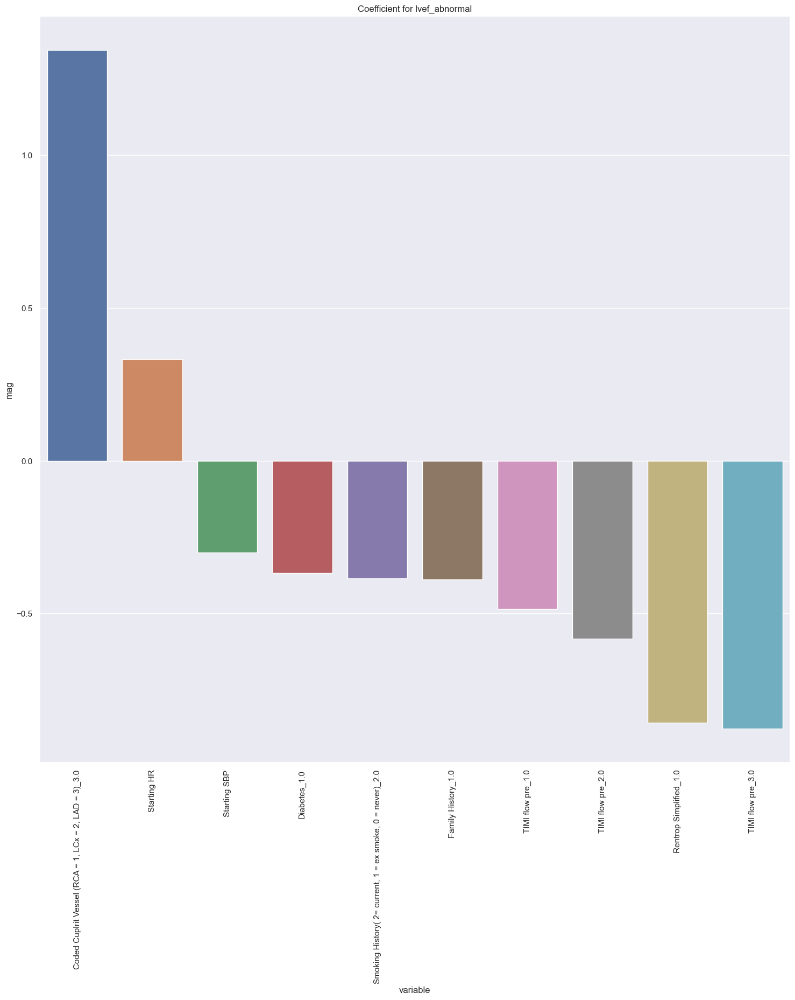

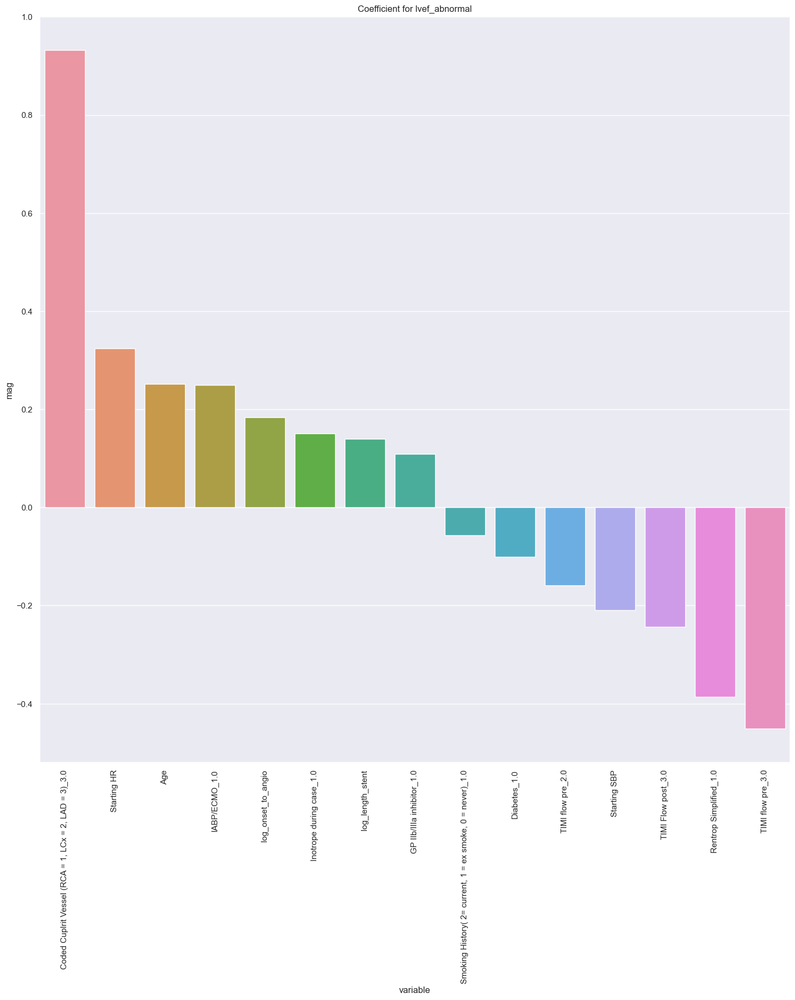

...

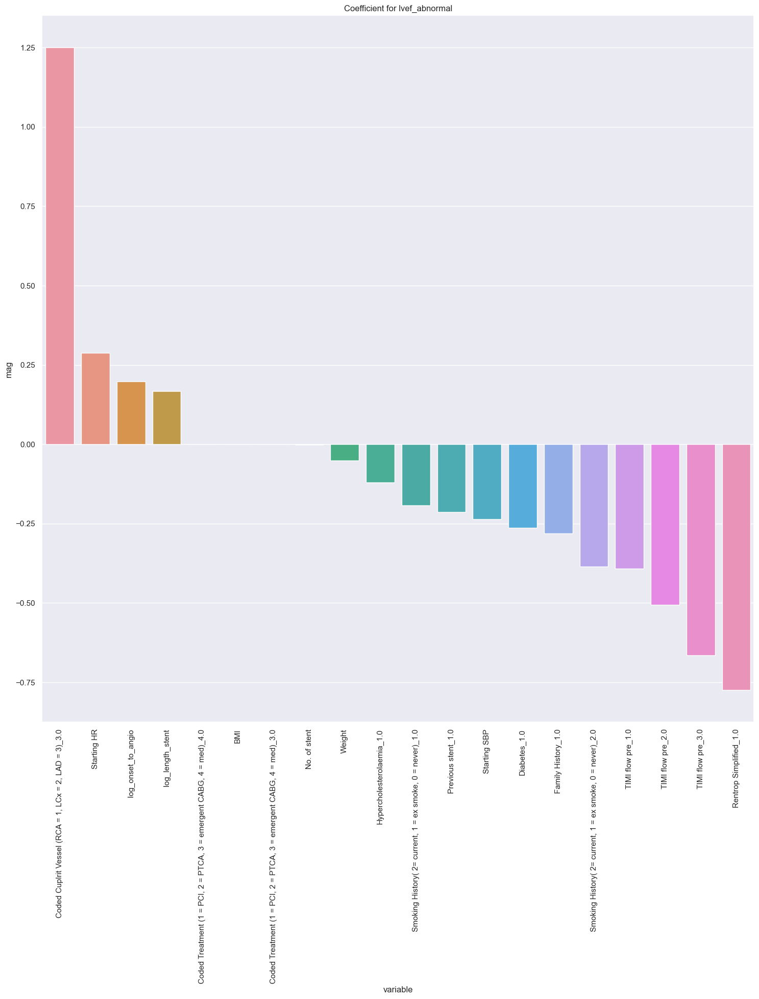

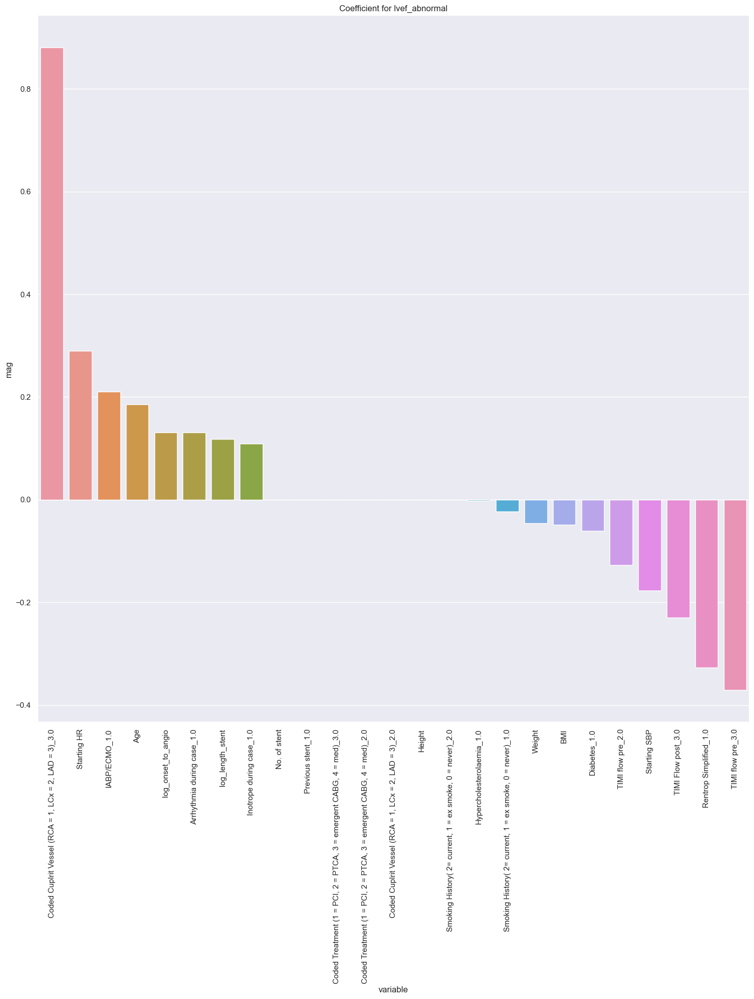

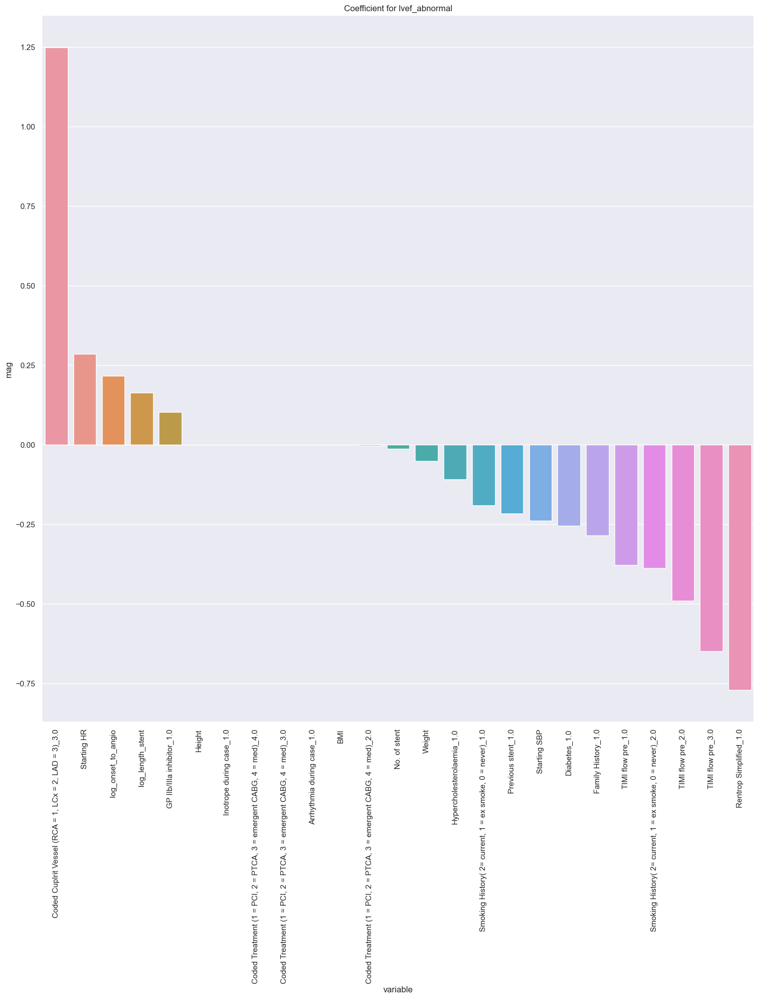

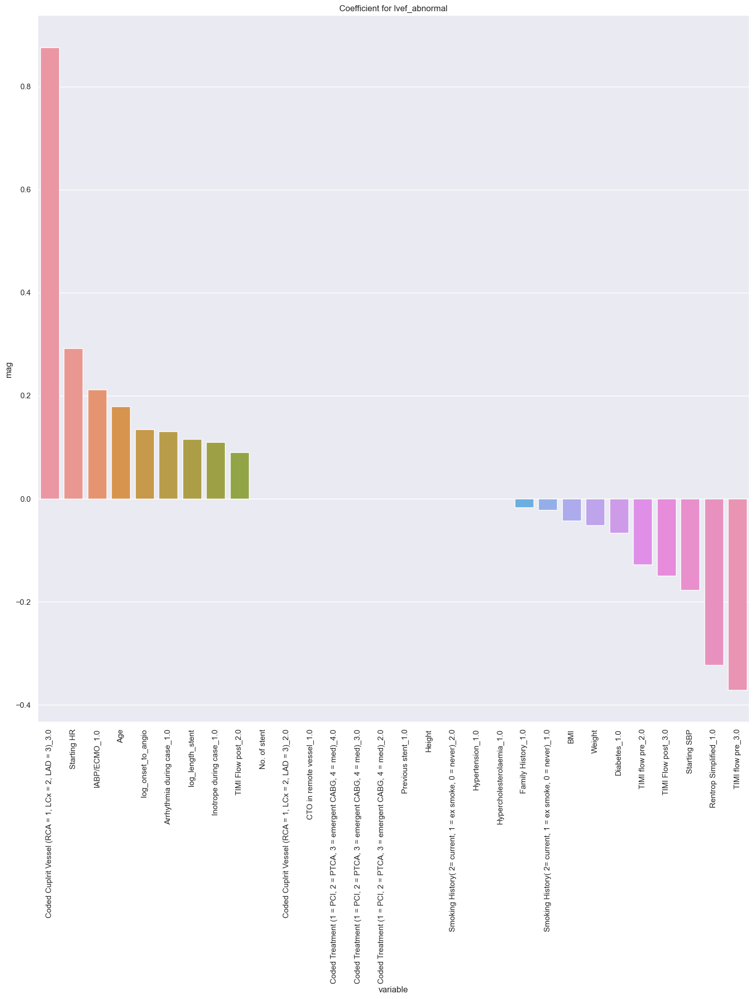

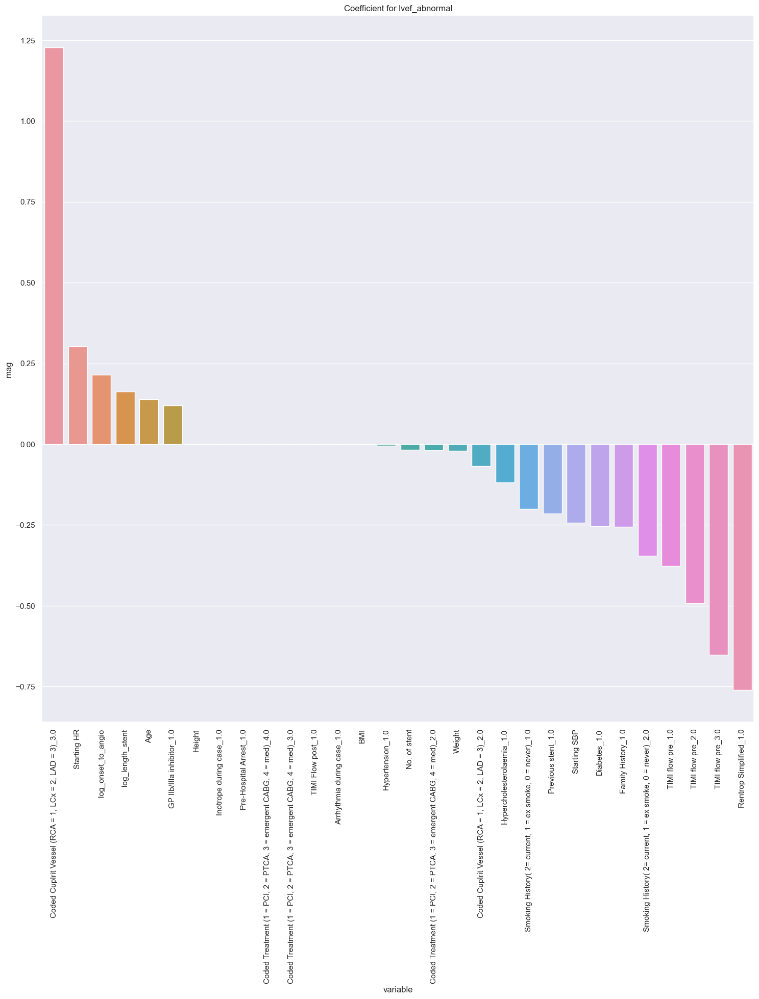

In [58]:
for model_type in ['l1','l2','elasticnet']:
    for n in n_features:
        for use_oversample in [False,True]:
            for p in predictors:
                if use_oversample:
                    model_name = model_type + "_feature_selection" +str(n)+ "_oversample_oversample"
                else:
                    model_name = model_type + "_feature_selection" +str(n)
                pipe = joblib.load("model/" + model_name + "_" + p +".pickle")
                ax = plot_coef(pipe,model_name,X_train.columns)

In [55]:
for model_type in ['l1','l2','elasticnet']:
    for n in n_features:
        for use_oversample in [False,True]:
            for p in predictors:
                if use_oversample:
                    model_name = model_type + "_feature_selection" +str(n)+ "_oversample_oversample"
                else:
                    model_name = model_type + "_feature_selection" +str(n)

                y_test = df_dummy.loc[test[p],p]
                X_test = df_dummy.iloc[test[p]].drop(predictors, axis=1)
                pipe = joblib.load("model/" + model_name + "_" + p +".pickle")
                test_result_df = evaluate_model(pipe,X_test,y_test)
                test_result_df["outcome"] = p
                test_result_df["model"] = model_name

                test_df = pd.concat([test_df,test_result_df],ignore_index=True)

In [60]:
score_df.to_csv(cv_result_filename )
test_df.to_csv(test_result_filename)

In [59]:
test_df

,model,accuracy,precision,recall,f1_score,auc,outcome
0,lr_baseline,0.907188,0.184211,0.344262,0.240000,0.638239,lvef_abnormal
1,lr_baseline,0.908725,0.365672,0.490000,0.418803,0.714424,In-Hospital Mortality
2,lr_baseline,0.880109,0.742424,0.408333,0.526882,0.690323,ICU admission
3,logistic_feature_selection5_oversample,0.729805,0.080000,0.615385,0.141593,0.674744,lvef_abnormal
4,logistic_feature_selection5_oversample,0.734584,0.161905,0.607143,0.255639,0.676035,In-Hospital Mortality
...,...,...,...,...,...,...,...
347,elasticnet_feature_selection20_oversample_over...,0.740947,0.456311,0.559524,0.502674,0.677944,lvef_abnormal
348,elasticnet_feature_selection25,0.791086,0.666667,0.214286,0.324324,0.590779,lvef_abnormal
349,elasticnet_feature_selection25_oversample_over...,0.740947,0.453608,0.523810,0.486188,0.665541,lvef_abnormal
350,elasticnet_feature_selection30,0.791086,0.666667,0.214286,0.324324,0.590779,lvef_abnormal


## ensemble

In [114]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC

In [115]:
score_df = pd.read_csv(cv_result_filename ,index_col=0)
test_df = pd.read_csv(test_result_filename,index_col=0)

In [116]:
def train_model_gridcv(X,y,y_name,model,model_name,
                       param_grid,
                impute=True,
                scale=True,
                oversample=False,
                feature_select=None,
                categorical_features=None,
               score_method='accuracy'):
    pipeline_steps = []
    
    if impute:
        pipeline_steps.append( ('imputer',SimpleImputer(missing_values=np.nan, strategy='median')))
        
    if scale:
        pipeline_steps.append(  ('scaler',StandardScaler()))
    
    if oversample:
        cat_col_index = [i for i, x in enumerate(X.columns) if x in df_dummy_cat_cols]
        pipeline_steps.append(("sampler",SMOTENC(categorical_features=cat_col_index, random_state=random_seed)))
        model_name += '_oversample'
            
    if feature_select is not None:
         pipeline_steps.append(("feature_select",feature_select))
        
    
    pipeline_steps.append(  ('model',model))
    
    pipe = Pipeline(steps = pipeline_steps)
    
    grid = GridSearchCV(pipe,
                    param_grid = param_grid,cv=5,scoring=scoring_method,verbose=10)

    grid.fit(X_train, y_train)
    
    joblib.dump(grid.best_estimator_,"model/" + model_name + "_"+p+".pickle")
    
    
    cv_result = cross_validate(grid.best_estimator_, X, y, cv=5,scoring=scoring)
    results = [{k : v.mean() for k, v in cv_result.items()}]

    df_cv_result = pd.DataFrame(results, index=[model_name])
    df_cv_result["outcome"] = p
    df_cv_result["model"] = model_name
    
    
    return grid.best_estimator_,df_cv_result

In [117]:
for model_type in ['svm','rf','dt']:
#for model_type in ['rf','dt']:
    for n in n_features:
        for use_oversample in [False,True]:
            lr_model_name = "l1_baseline"
            
            if use_oversample:
                lr_model_name += '_oversample'
            for p in predictors:  
                if model_type == 'ada':
                    model_name = "adaboost_feature_selection" + str(n)
                    model = AdaBoostClassifier(random_state=random_seed)
                    param_grid = {
                        "model__n_estimators": np.arange(16,24,2),
                        'model__learning_rate':np.linspace(1e-1,5,num=10), 
                    }
                elif model_type == 'gb':
                    model_name = "gb_feature_selection" + str(n)
                    model = GradientBoostingClassifier(random_state=random_seed,n_estimators=50)
                    param_grid = {
                        "model__max_depth": np.arange(1,5,1),
                        'model__max_features':['sqrt'],
                        'model__learning_rate':np.linspace(1e-5,1e-3,5)
                    }
                elif model_type == 'svm':
                    model_name = "svm_feature_selection" + str(n)
                    model = SVC(random_state=random_seed,probability=True)
                    param_grid = {
                        "model__kernel": ['rbf'],
                        'model__C':np.linspace(1e-1,1,num=10), 
                        #'model__degree':[3,5,7,9], 
                    }
                elif model_type == 'rf':
                    model_name = "rf_feature_selection" + str(n)
                    model = RandomForestClassifier(
                         random_state=random_seed,max_features = 'sqrt')
                    param_grid = {
                        'model__max_depth': np.arange(1,11,1) 
                    }
                elif model_type == 'dt':
                    model_name = "decision_feature_selection" + str(n)
                    model = DecisionTreeClassifier(random_state=random_seed)
                    param_grid = {
                        'model__max_depth': np.arange(1,11,1) 
                    }


                y_train = df_dummy.loc[train[p],p]
                X_train = df_dummy.iloc[train[p]].drop(predictors, axis=1)



                loaded_pipe = joblib.load("model/" + lr_model_name + "_" + p +".pickle")
                feature_select_model =  SelectFromModel(LogisticRegression(**loaded_pipe.named_steps["logistic"].get_params())
                                                      ,max_features=n)

                pipe,df_cv_result = train_model_gridcv(
                                        X_train,
                                        y_train,
                                        p,
                                        model,
                                        model_name,
                                        param_grid,
                                        feature_select=feature_select_model,
                                        score_method=scoring_method,
                                        oversample=use_oversample)


                score_df = pd.concat([score_df,df_cv_result],ignore_index=True)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.584 total time=   0.2s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.644 total time=   0.2s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.684 total time=   0.2s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.617 total time=   0.2s
[CV 5/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 5/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.686 total time=   0.1s
[CV 1/5; 2/10] START model__C=0.2, model__kernel=rbf............................
[CV 1/5; 2/10] END model__C=0.2, 

[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.572 total time=   0.2s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.707 total time=   0.2s


D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.692 total time=   0.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.698 total time=   0.2s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.642 total time=   0.1s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.540 total time=   0.1s
[CV 5/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 5/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.538 total time=   0.2s
[CV 1/5; 2/10] START model__C=0.2, model__kernel=rbf............................
[CV 1/5; 2/10] END model__C=0.2, 

[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.559 total time=   0.1s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.594 total time=   0.2s


D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.686 total time=   0.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.668 total time=   0.1s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.735 total time=   0.1s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.750 total time=   0.1s
[CV 5/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 5/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.720 total time=   0.2s
[CV 1/5; 2/10] START model__C=0.2, model__kernel=rbf............................
[CV 1/5; 2/10] END model__C=0.2, 

[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.717 total time=   0.1s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.708 total time=   0.2s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.697 total time=   0.9s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.723 total time=   0.7s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.668 total time=   0.7s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.548 total time=   0.8s
[CV 5/5; 1/10] START model__

[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.631 total time=   0.6s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.620 total time=   0.7s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.752 total time=   0.8s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.781 total time=   1.2s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.594 total time=   1.0s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.704 total time=   1.0s
[CV 4/5; 1/10] START model_

[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.605 total time=   1.0s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.675 total time=   0.9s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.724 total time=   1.1s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.622 total time=   1.4s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.635 total time=   1.0s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.680 total time=   1.0s
[CV 3/5; 1/10] START model

[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.670 total time=   1.0s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.673 total time=   1.0s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.696 total time=   1.0s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.645 total time=   1.0s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.631 total time=   1.2s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.658 total time=   0.2s
[CV 2/5; 1/10] START mode

[CV 5/5; 9/10] END model__C=0.9, model__kernel=rbf;, score=0.722 total time=   0.2s
[CV 1/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.626 total time=   0.2s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.734 total time=   0.2s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.661 total time=   0.2s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.656 total time=   0.2s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.718 total time=   0.1s


D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.858 total time=   0.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.771 total time=   0.2s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.709 total time=   0.1s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.615 total time=   0.1s
[CV 5/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 5/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.785 total time=   0.2s
[CV 1/5; 2/10] START model__C=0.2, model__kernel=rbf............................
[CV 1/5; 2/10] END model__C=0.2, 

[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.615 total time=   0.1s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.785 total time=   0.2s


D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.812 total time=   0.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.733 total time=   0.1s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.749 total time=   0.1s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.781 total time=   0.1s
[CV 5/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 5/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.779 total time=   0.1s
[CV 1/5; 2/10] START model__C=0.2, model__kernel=rbf............................
[CV 1/5; 2/10] END model__C=0.2, 

[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.762 total time=   0.1s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.787 total time=   0.2s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.682 total time=   0.9s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.806 total time=   0.9s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.746 total time=   0.8s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.745 total time=   0.9s
[CV 5/5; 1/10] START model__

[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.728 total time=   0.8s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.723 total time=   0.9s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.731 total time=   0.8s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.841 total time=   1.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.699 total time=   1.1s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.801 total time=   1.0s
[CV 4/5; 1/10] START model_

[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.713 total time=   1.0s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.800 total time=   0.9s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.774 total time=   0.8s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.610 total time=   1.0s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.740 total time=   0.9s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.768 total time=   0.9s
[CV 3/5; 1/10] START model

[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.729 total time=   0.8s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.757 total time=   0.8s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.709 total time=   0.8s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.725 total time=   0.9s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.680 total time=   1.0s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.653 total time=   0.2s
[CV 2/5; 1/10] START mode

[CV 5/5; 9/10] END model__C=0.9, model__kernel=rbf;, score=0.745 total time=   0.2s
[CV 1/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.642 total time=   0.2s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.809 total time=   0.2s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.663 total time=   0.2s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.702 total time=   0.2s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.744 total time=   0.2s


D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.799 total time=   0.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.844 total time=   0.2s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.709 total time=   0.1s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.700 total time=   0.1s
[CV 5/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 5/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.756 total time=   0.2s
[CV 1/5; 2/10] START model__C=0.2, model__kernel=rbf............................
[CV 1/5; 2/10] END model__C=0.2, 

[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.699 total time=   0.1s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.754 total time=   0.2s


D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.839 total time=   0.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.803 total time=   0.1s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.779 total time=   0.2s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.814 total time=   0.1s
[CV 5/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 5/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.800 total time=   0.2s
[CV 1/5; 2/10] START model__C=0.2, model__kernel=rbf............................
[CV 1/5; 2/10] END model__C=0.2, 

[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.795 total time=   0.1s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.778 total time=   0.2s


D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.672 total time=   0.9s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.820 total time=   0.9s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.738 total time=   0.9s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.731 total time=   0.9s
[CV 5/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 5/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.772 total time=   0.9s
[CV 1/5; 2/10] START model__C=0.2, model__kernel=rbf............................
[CV 1/5; 2/10] END model__C=0.2, 

[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.742 total time=   0.9s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.769 total time=   0.8s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.845 total time=   1.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.767 total time=   1.2s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.777 total time=   1.1s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.786 total time=   1.1s
[CV 5/5; 1/10] START model__

[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.767 total time=   0.9s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.774 total time=   0.8s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.707 total time=   1.0s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.737 total time=   1.0s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.772 total time=   1.0s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.742 total time=   1.0s
[CV 4/5; 1/10] START model_

[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.768 total time=   0.8s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.732 total time=   0.9s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.775 total time=   0.9s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.700 total time=   1.0s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.658 total time=   0.2s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.803 total time=   0.2s
[CV 3/5; 1/10] START model

[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.653 total time=   0.2s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.801 total time=   0.3s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.734 total time=   0.2s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.726 total time=   0.2s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.710 total time=   0.2s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.845 total time=   0.1s
[CV 2/5; 1/10] START mode

[CV 5/5; 9/10] END model__C=0.9, model__kernel=rbf;, score=0.896 total time=   0.2s
[CV 1/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.846 total time=   0.1s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.855 total time=   0.2s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.738 total time=   0.1s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.783 total time=   0.1s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.895 total time=   0.2s


D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.825 total time=   0.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.784 total time=   0.1s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.809 total time=   0.2s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.818 total time=   0.1s
[CV 5/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 5/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.773 total time=   0.2s
[CV 1/5; 2/10] START model__C=0.2, model__kernel=rbf............................
[CV 1/5; 2/10] END model__C=0.2, 

[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.820 total time=   0.1s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.764 total time=   0.2s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.678 total time=   0.9s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.781 total time=   0.9s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.736 total time=   1.0s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.727 total time=   1.0s
[CV 5/5; 1/10] START model__

[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.716 total time=   0.8s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.713 total time=   0.9s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.772 total time=   0.8s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.835 total time=   1.2s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.770 total time=   1.3s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.829 total time=   1.2s
[CV 4/5; 1/10] START model_

[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.796 total time=   1.0s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.811 total time=   0.9s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.801 total time=   0.8s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.748 total time=   0.9s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.772 total time=   1.0s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.765 total time=   1.0s
[CV 3/5; 1/10] START model

[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.785 total time=   0.9s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.772 total time=   0.9s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.747 total time=   0.9s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.794 total time=   1.0s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.716 total time=   0.9s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.671 total time=   0.2s
[CV 2/5; 1/10] START mode

[CV 5/5; 9/10] END model__C=0.9, model__kernel=rbf;, score=0.744 total time=   0.2s
[CV 1/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.675 total time=   0.2s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.765 total time=   0.3s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.711 total time=   0.3s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.730 total time=   0.2s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.743 total time=   0.2s


D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.861 total time=   0.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.889 total time=   0.2s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.781 total time=   0.1s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.813 total time=   0.1s
[CV 5/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 5/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.859 total time=   0.2s
[CV 1/5; 2/10] START model__C=0.2, model__kernel=rbf............................
[CV 1/5; 2/10] END model__C=0.2, 

[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.813 total time=   0.1s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.860 total time=   0.2s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.845 total time=   0.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.802 total time=   0.1s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.784 total time=   0.2s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.826 total time=   0.2s
[CV 5/5; 1/10] START model__

[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.786 total time=   0.2s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.828 total time=   0.2s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.778 total time=   0.2s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.671 total time=   0.9s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.777 total time=   1.0s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.727 total time=   0.9s
[CV 4/5; 1/10] START model_

[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.816 total time=   0.9s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.709 total time=   0.8s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.721 total time=   0.9s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.771 total time=   0.8s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.819 total time=   1.2s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.722 total time=   1.3s
[CV 3/5; 1/10] START model

[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.833 total time=   0.9s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.806 total time=   1.0s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.785 total time=   0.9s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.816 total time=   0.8s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.774 total time=   1.0s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.794 total time=   1.0s
[CV 2/5; 1/10] START mode

[CV 5/5; 9/10] END model__C=0.9, model__kernel=rbf;, score=0.728 total time=   0.9s
[CV 1/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.797 total time=   0.9s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.760 total time=   0.8s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.765 total time=   0.8s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.802 total time=   0.9s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.728 total time=   0.9s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START mode

[CV 4/5; 9/10] END model__C=0.9, model__kernel=rbf;, score=0.714 total time=   0.2s
[CV 5/5; 9/10] START model__C=0.9, model__kernel=rbf............................
[CV 5/5; 9/10] END model__C=0.9, model__kernel=rbf;, score=0.757 total time=   0.2s
[CV 1/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.691 total time=   0.2s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.748 total time=   0.3s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.708 total time=   0.2s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.714 total time=   0.2s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/

[CV 3/5; 9/10] END model__C=0.9, model__kernel=rbf;, score=0.777 total time=   0.1s
[CV 4/5; 9/10] START model__C=0.9, model__kernel=rbf............................
[CV 4/5; 9/10] END model__C=0.9, model__kernel=rbf;, score=0.811 total time=   0.1s
[CV 5/5; 9/10] START model__C=0.9, model__kernel=rbf............................
[CV 5/5; 9/10] END model__C=0.9, model__kernel=rbf;, score=0.864 total time=   0.2s
[CV 1/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.863 total time=   0.1s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.847 total time=   0.2s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.777 total time=   0.1s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5

D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.840 total time=   0.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.780 total time=   0.2s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.789 total time=   0.2s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.819 total time=   0.2s
[CV 5/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 5/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.800 total time=   0.2s
[CV 1/5; 2/10] START model__C=0.2, model__kernel=rbf............................
[CV 1/5; 2/10] END model__C=0.2, 

[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.818 total time=   0.2s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.793 total time=   0.2s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.637 total time=   1.0s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.760 total time=   1.0s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.717 total time=   1.0s
[CV 4/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 4/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.725 total time=   1.1s
[CV 5/5; 1/10] START model__

[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.714 total time=   0.8s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.727 total time=   0.9s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.772 total time=   0.8s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.804 total time=   1.3s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.759 total time=   1.4s
[CV 3/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 3/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.805 total time=   1.3s
[CV 4/5; 1/10] START model_

[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.832 total time=   1.0s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.798 total time=   0.9s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.810 total time=   0.9s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.775 total time=   1.0s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 1/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.791 total time=   1.1s
[CV 2/5; 1/10] START model__C=0.1, model__kernel=rbf............................
[CV 2/5; 1/10] END model__C=0.1, model__kernel=rbf;, score=0.764 total time=   1.1s
[CV 3/5; 1/10] START model

[CV 1/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.798 total time=   0.9s
[CV 2/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 2/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.781 total time=   0.9s
[CV 3/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 3/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.756 total time=   0.9s
[CV 4/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 4/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.824 total time=   0.9s
[CV 5/5; 10/10] START model__C=1.0, model__kernel=rbf...........................
[CV 5/5; 10/10] END model__C=1.0, model__kernel=rbf;, score=0.728 total time=   1.0s
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__max_depth=1.........................................
[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.721 total time=   0.2s
[CV 2/5; 1/10] START model__

[CV 2/5; 10/10] END ........model__max_depth=10;, score=0.791 total time=   0.2s
[CV 3/5; 10/10] START model__max_depth=10.......................................
[CV 3/5; 10/10] END ........model__max_depth=10;, score=0.725 total time=   0.2s
[CV 4/5; 10/10] START model__max_depth=10.......................................
[CV 4/5; 10/10] END ........model__max_depth=10;, score=0.715 total time=   0.1s
[CV 5/5; 10/10] START model__max_depth=10.......................................
[CV 5/5; 10/10] END ........model__max_depth=10;, score=0.733 total time=   0.1s


D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__max_depth=1.........................................
[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.853 total time=   0.1s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.845 total time=   0.2s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.799 total time=   0.1s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.835 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.862 total time=   0.2s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;

D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__max_depth=1.........................................
[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.764 total time=   0.1s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.726 total time=   0.1s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.807 total time=   0.1s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.785 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.777 total time=   0.1s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;

[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.719 total time=   0.5s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.792 total time=   0.5s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.775 total time=   0.4s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.714 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.793 total time=   0.4s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.718 total time=   0.5s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END .........

[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.735 total time=   0.7s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.762 total time=   0.6s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.742 total time=   0.6s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.645 total time=   0.6s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.849 total time=   0.6s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.738 total time=   0.7s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END .........

[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.734 total time=   0.4s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.722 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.656 total time=   0.5s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.706 total time=   0.5s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.726 total time=   0.4s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.729 total time=   0.5s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END .........

[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.771 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.792 total time=   0.1s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.739 total time=   0.1s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.828 total time=   0.1s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.790 total time=   0.1s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.769 total time=   0.1s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END .........

[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.876 total time=   0.2s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.887 total time=   0.1s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.883 total time=   0.2s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.804 total time=   0.1s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.829 total time=   0.1s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END ..........model__max_depth=2;, score=0.896 total time=   0.2s
[CV 1/5; 3/10] START model__max_depth=3.........................................
[CV 1/5; 3/10] END .........

D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__max_depth=1.........................................
[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.815 total time=   0.1s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.749 total time=   0.1s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.815 total time=   0.1s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.801 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.778 total time=   0.1s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;

[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.697 total time=   0.5s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.806 total time=   0.5s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.760 total time=   0.4s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.743 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.797 total time=   0.4s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.710 total time=   0.5s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END .........

[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.764 total time=   0.7s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.845 total time=   0.6s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.752 total time=   0.6s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.685 total time=   0.6s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.856 total time=   0.6s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.782 total time=   0.7s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END .........

[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.766 total time=   0.4s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.745 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.743 total time=   0.5s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.755 total time=   0.4s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.790 total time=   0.4s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.751 total time=   0.5s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END .........

[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.782 total time=   0.1s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.736 total time=   0.1s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.832 total time=   0.1s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.785 total time=   0.1s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.782 total time=   0.1s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END ..........model__max_depth=2;, score=0.784 total time=   0.1s
[CV 1/5; 3/10] START model__max_depth=3.........................................
[CV 1/5; 3/10] END .........

D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__max_depth=1.........................................
[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.835 total time=   0.1s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.877 total time=   0.2s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.798 total time=   0.1s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.819 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.868 total time=   0.2s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;

D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__max_depth=1.........................................
[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.845 total time=   0.1s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.757 total time=   0.1s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.829 total time=   0.1s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.826 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.786 total time=   0.1s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;

[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.690 total time=   0.5s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.805 total time=   0.5s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.746 total time=   0.4s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.739 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.783 total time=   0.5s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.694 total time=   0.5s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END .........

[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.804 total time=   0.7s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.861 total time=   0.6s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.780 total time=   0.6s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.725 total time=   0.6s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.858 total time=   0.6s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.799 total time=   0.7s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END .........

[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.755 total time=   0.4s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.791 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.755 total time=   0.5s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.746 total time=   0.5s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.787 total time=   0.4s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.757 total time=   0.5s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END .........

[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.770 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.783 total time=   0.1s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.725 total time=   0.1s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.839 total time=   0.1s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.777 total time=   0.1s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.773 total time=   0.1s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END .........

[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.878 total time=   0.2s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.846 total time=   0.1s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.853 total time=   0.2s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.794 total time=   0.1s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.868 total time=   0.1s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END ..........model__max_depth=2;, score=0.900 total time=   0.2s
[CV 1/5; 3/10] START model__max_depth=3.........................................
[CV 1/5; 3/10] END .........

D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__max_depth=1.........................................
[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.829 total time=   0.1s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.754 total time=   0.1s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.838 total time=   0.1s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.831 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.771 total time=   0.1s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;

[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.677 total time=   0.5s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.802 total time=   0.5s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.749 total time=   0.4s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.739 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.762 total time=   0.4s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.678 total time=   0.5s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END .........

[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.770 total time=   0.7s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.884 total time=   0.6s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.733 total time=   0.6s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.724 total time=   0.6s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.840 total time=   0.6s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.781 total time=   0.7s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END .........

[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.761 total time=   0.5s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.789 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.758 total time=   0.6s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.729 total time=   0.5s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.786 total time=   0.5s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.754 total time=   0.5s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END .........

[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.784 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.776 total time=   0.1s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.738 total time=   0.1s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.844 total time=   0.1s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.796 total time=   0.2s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.779 total time=   0.1s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END .........

D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__max_depth=1.........................................
[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.836 total time=   0.1s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.851 total time=   0.2s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.741 total time=   0.1s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.872 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.867 total time=   0.2s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;

D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__max_depth=1.........................................
[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.818 total time=   0.1s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.760 total time=   0.1s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.849 total time=   0.1s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.828 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.788 total time=   0.1s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;

[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.688 total time=   0.5s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.803 total time=   0.5s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.759 total time=   0.4s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.744 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.770 total time=   0.4s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.691 total time=   0.5s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END .........

[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.783 total time=   0.7s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.871 total time=   0.6s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.775 total time=   0.6s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.718 total time=   0.6s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.876 total time=   0.6s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.799 total time=   0.7s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END .........

[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.750 total time=   0.5s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.770 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.775 total time=   0.6s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.740 total time=   0.5s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.792 total time=   0.5s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.762 total time=   0.5s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END .........

[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.766 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.775 total time=   0.1s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.726 total time=   0.1s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.842 total time=   0.1s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.766 total time=   0.1s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.774 total time=   0.1s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END .........

[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.871 total time=   0.2s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.859 total time=   0.1s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.856 total time=   0.2s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.781 total time=   0.1s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.852 total time=   0.1s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END ..........model__max_depth=2;, score=0.885 total time=   0.2s
[CV 1/5; 3/10] START model__max_depth=3.........................................
[CV 1/5; 3/10] END .........

D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__max_depth=1.........................................
[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.829 total time=   0.1s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.776 total time=   0.1s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.846 total time=   0.1s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.836 total time=   0.1s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.791 total time=   0.1s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;

[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.687 total time=   0.5s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.808 total time=   0.5s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.764 total time=   0.4s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.755 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.776 total time=   0.4s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.686 total time=   0.5s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END .........

[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.743 total time=   0.7s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.875 total time=   0.6s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.740 total time=   0.6s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.760 total time=   0.6s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.881 total time=   0.6s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.777 total time=   0.7s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END .........

[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.773 total time=   0.5s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.805 total time=   0.5s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.766 total time=   0.6s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.750 total time=   0.5s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.792 total time=   0.4s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.760 total time=   0.5s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END .........

[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.711 total time=   0.0s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.777 total time=   0.0s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.729 total time=   0.0s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.682 total time=   0.0s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END ..........model__max_depth=2;, score=0.723 total time=   0.0s
[CV 1/5; 3/10] START model__max_depth=3.........................................
[CV 1/5; 3/10] END ..........model__max_depth=3;, score=0.689 total time=   0.0s
[CV 2/5; 3/10] START model__max_depth=3.........................................
[CV 2/5; 3/10] END .........

[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.779 total time=   0.1s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.593 total time=   0.0s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.673 total time=   0.0s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END ..........model__max_depth=2;, score=0.752 total time=   0.1s
[CV 1/5; 3/10] START model__max_depth=3.........................................
[CV 1/5; 3/10] END ..........model__max_depth=3;, score=0.746 total time=   0.0s
[CV 2/5; 3/10] START model__max_depth=3.........................................
[CV 2/5; 3/10] END ..........model__max_depth=3;, score=0.777 total time=   0.1s
[CV 3/5; 3/10] START model__max_depth=3.........................................
[CV 3/5; 3/10] END .........

[CV 5/5; 2/10] END ..........model__max_depth=2;, score=0.678 total time=   0.0s
[CV 1/5; 3/10] START model__max_depth=3.........................................
[CV 1/5; 3/10] END ..........model__max_depth=3;, score=0.714 total time=   0.0s
[CV 2/5; 3/10] START model__max_depth=3.........................................
[CV 2/5; 3/10] END ..........model__max_depth=3;, score=0.664 total time=   0.0s
[CV 3/5; 3/10] START model__max_depth=3.........................................
[CV 3/5; 3/10] END ..........model__max_depth=3;, score=0.715 total time=   0.0s
[CV 4/5; 3/10] START model__max_depth=3.........................................
[CV 4/5; 3/10] END ..........model__max_depth=3;, score=0.688 total time=   0.0s
[CV 5/5; 3/10] START model__max_depth=3.........................................
[CV 5/5; 3/10] END ..........model__max_depth=3;, score=0.679 total time=   0.0s
[CV 1/5; 4/10] START model__max_depth=4.........................................
[CV 1/5; 4/10] END .........

[CV 1/5; 3/10] END ..........model__max_depth=3;, score=0.660 total time=   0.3s
[CV 2/5; 3/10] START model__max_depth=3.........................................
[CV 2/5; 3/10] END ..........model__max_depth=3;, score=0.765 total time=   0.4s
[CV 3/5; 3/10] START model__max_depth=3.........................................
[CV 3/5; 3/10] END ..........model__max_depth=3;, score=0.755 total time=   0.3s
[CV 4/5; 3/10] START model__max_depth=3.........................................
[CV 4/5; 3/10] END ..........model__max_depth=3;, score=0.675 total time=   0.4s
[CV 5/5; 3/10] START model__max_depth=3.........................................
[CV 5/5; 3/10] END ..........model__max_depth=3;, score=0.766 total time=   0.3s
[CV 1/5; 4/10] START model__max_depth=4.........................................
[CV 1/5; 4/10] END ..........model__max_depth=4;, score=0.684 total time=   0.3s
[CV 2/5; 4/10] START model__max_depth=4.........................................
[CV 2/5; 4/10] END .........

[CV 2/5; 3/10] END ..........model__max_depth=3;, score=0.749 total time=   0.6s
[CV 3/5; 3/10] START model__max_depth=3.........................................
[CV 3/5; 3/10] END ..........model__max_depth=3;, score=0.745 total time=   0.4s
[CV 4/5; 3/10] START model__max_depth=3.........................................
[CV 4/5; 3/10] END ..........model__max_depth=3;, score=0.626 total time=   0.5s
[CV 5/5; 3/10] START model__max_depth=3.........................................
[CV 5/5; 3/10] END ..........model__max_depth=3;, score=0.635 total time=   0.5s
[CV 1/5; 4/10] START model__max_depth=4.........................................
[CV 1/5; 4/10] END ..........model__max_depth=4;, score=0.792 total time=   0.4s
[CV 2/5; 4/10] START model__max_depth=4.........................................
[CV 2/5; 4/10] END ..........model__max_depth=4;, score=0.746 total time=   0.6s
[CV 3/5; 4/10] START model__max_depth=4.........................................
[CV 3/5; 4/10] END .........

[CV 3/5; 3/10] END ..........model__max_depth=3;, score=0.700 total time=   0.3s
[CV 4/5; 3/10] START model__max_depth=3.........................................
[CV 4/5; 3/10] END ..........model__max_depth=3;, score=0.674 total time=   0.3s
[CV 5/5; 3/10] START model__max_depth=3.........................................
[CV 5/5; 3/10] END ..........model__max_depth=3;, score=0.615 total time=   0.4s
[CV 1/5; 4/10] START model__max_depth=4.........................................
[CV 1/5; 4/10] END ..........model__max_depth=4;, score=0.664 total time=   0.3s
[CV 2/5; 4/10] START model__max_depth=4.........................................
[CV 2/5; 4/10] END ..........model__max_depth=4;, score=0.708 total time=   0.3s
[CV 3/5; 4/10] START model__max_depth=4.........................................
[CV 3/5; 4/10] END ..........model__max_depth=4;, score=0.655 total time=   0.3s
[CV 4/5; 4/10] START model__max_depth=4.........................................
[CV 4/5; 4/10] END .........

[CV 1/5; 4/10] END ..........model__max_depth=4;, score=0.716 total time=   0.0s
[CV 2/5; 4/10] START model__max_depth=4.........................................
[CV 2/5; 4/10] END ..........model__max_depth=4;, score=0.810 total time=   0.0s
[CV 3/5; 4/10] START model__max_depth=4.........................................
[CV 3/5; 4/10] END ..........model__max_depth=4;, score=0.769 total time=   0.0s
[CV 4/5; 4/10] START model__max_depth=4.........................................
[CV 4/5; 4/10] END ..........model__max_depth=4;, score=0.726 total time=   0.0s
[CV 5/5; 4/10] START model__max_depth=4.........................................
[CV 5/5; 4/10] END ..........model__max_depth=4;, score=0.751 total time=   0.0s
[CV 1/5; 5/10] START model__max_depth=5.........................................
[CV 1/5; 5/10] END ..........model__max_depth=5;, score=0.661 total time=   0.0s
[CV 2/5; 5/10] START model__max_depth=5.........................................
[CV 2/5; 5/10] END .........

[CV 2/5; 4/10] END ..........model__max_depth=4;, score=0.786 total time=   0.1s
[CV 3/5; 4/10] START model__max_depth=4.........................................
[CV 3/5; 4/10] END ..........model__max_depth=4;, score=0.571 total time=   0.0s
[CV 4/5; 4/10] START model__max_depth=4.........................................
[CV 4/5; 4/10] END ..........model__max_depth=4;, score=0.669 total time=   0.0s
[CV 5/5; 4/10] START model__max_depth=4.........................................
[CV 5/5; 4/10] END ..........model__max_depth=4;, score=0.814 total time=   0.1s
[CV 1/5; 5/10] START model__max_depth=5.........................................
[CV 1/5; 5/10] END ..........model__max_depth=5;, score=0.641 total time=   0.0s
[CV 2/5; 5/10] START model__max_depth=5.........................................
[CV 2/5; 5/10] END ..........model__max_depth=5;, score=0.756 total time=   0.1s
[CV 3/5; 5/10] START model__max_depth=5.........................................
[CV 3/5; 5/10] END .........

[CV 5/5; 4/10] END ..........model__max_depth=4;, score=0.676 total time=   0.0s
[CV 1/5; 5/10] START model__max_depth=5.........................................
[CV 1/5; 5/10] END ..........model__max_depth=5;, score=0.738 total time=   0.0s
[CV 2/5; 5/10] START model__max_depth=5.........................................
[CV 2/5; 5/10] END ..........model__max_depth=5;, score=0.689 total time=   0.0s
[CV 3/5; 5/10] START model__max_depth=5.........................................
[CV 3/5; 5/10] END ..........model__max_depth=5;, score=0.761 total time=   0.0s
[CV 4/5; 5/10] START model__max_depth=5.........................................
[CV 4/5; 5/10] END ..........model__max_depth=5;, score=0.721 total time=   0.0s
[CV 5/5; 5/10] START model__max_depth=5.........................................
[CV 5/5; 5/10] END ..........model__max_depth=5;, score=0.720 total time=   0.0s
[CV 1/5; 6/10] START model__max_depth=6.........................................
[CV 1/5; 6/10] END .........

[CV 1/5; 5/10] END ..........model__max_depth=5;, score=0.682 total time=   0.3s
[CV 2/5; 5/10] START model__max_depth=5.........................................
[CV 2/5; 5/10] END ..........model__max_depth=5;, score=0.795 total time=   0.4s
[CV 3/5; 5/10] START model__max_depth=5.........................................
[CV 3/5; 5/10] END ..........model__max_depth=5;, score=0.768 total time=   0.3s
[CV 4/5; 5/10] START model__max_depth=5.........................................
[CV 4/5; 5/10] END ..........model__max_depth=5;, score=0.687 total time=   0.4s
[CV 5/5; 5/10] START model__max_depth=5.........................................
[CV 5/5; 5/10] END ..........model__max_depth=5;, score=0.757 total time=   0.3s
[CV 1/5; 6/10] START model__max_depth=6.........................................
[CV 1/5; 6/10] END ..........model__max_depth=6;, score=0.668 total time=   0.3s
[CV 2/5; 6/10] START model__max_depth=6.........................................
[CV 2/5; 6/10] END .........

[CV 2/5; 5/10] END ..........model__max_depth=5;, score=0.737 total time=   0.6s
[CV 3/5; 5/10] START model__max_depth=5.........................................
[CV 3/5; 5/10] END ..........model__max_depth=5;, score=0.759 total time=   0.4s
[CV 4/5; 5/10] START model__max_depth=5.........................................
[CV 4/5; 5/10] END ..........model__max_depth=5;, score=0.641 total time=   0.4s
[CV 5/5; 5/10] START model__max_depth=5.........................................
[CV 5/5; 5/10] END ..........model__max_depth=5;, score=0.652 total time=   0.5s
[CV 1/5; 6/10] START model__max_depth=6.........................................
[CV 1/5; 6/10] END ..........model__max_depth=6;, score=0.819 total time=   0.4s
[CV 2/5; 6/10] START model__max_depth=6.........................................
[CV 2/5; 6/10] END ..........model__max_depth=6;, score=0.685 total time=   0.6s
[CV 3/5; 6/10] START model__max_depth=6.........................................
[CV 3/5; 6/10] END .........

[CV 3/5; 5/10] END ..........model__max_depth=5;, score=0.699 total time=   0.3s
[CV 4/5; 5/10] START model__max_depth=5.........................................
[CV 4/5; 5/10] END ..........model__max_depth=5;, score=0.678 total time=   0.3s
[CV 5/5; 5/10] START model__max_depth=5.........................................
[CV 5/5; 5/10] END ..........model__max_depth=5;, score=0.680 total time=   0.4s
[CV 1/5; 6/10] START model__max_depth=6.........................................
[CV 1/5; 6/10] END ..........model__max_depth=6;, score=0.688 total time=   0.3s
[CV 2/5; 6/10] START model__max_depth=6.........................................
[CV 2/5; 6/10] END ..........model__max_depth=6;, score=0.726 total time=   0.3s
[CV 3/5; 6/10] START model__max_depth=6.........................................
[CV 3/5; 6/10] END ..........model__max_depth=6;, score=0.675 total time=   0.3s
[CV 4/5; 6/10] START model__max_depth=6.........................................
[CV 4/5; 6/10] END .........

[CV 1/5; 6/10] END ..........model__max_depth=6;, score=0.689 total time=   0.0s
[CV 2/5; 6/10] START model__max_depth=6.........................................
[CV 2/5; 6/10] END ..........model__max_depth=6;, score=0.734 total time=   0.0s
[CV 3/5; 6/10] START model__max_depth=6.........................................
[CV 3/5; 6/10] END ..........model__max_depth=6;, score=0.753 total time=   0.0s
[CV 4/5; 6/10] START model__max_depth=6.........................................
[CV 4/5; 6/10] END ..........model__max_depth=6;, score=0.698 total time=   0.0s
[CV 5/5; 6/10] START model__max_depth=6.........................................
[CV 5/5; 6/10] END ..........model__max_depth=6;, score=0.641 total time=   0.0s
[CV 1/5; 7/10] START model__max_depth=7.........................................
[CV 1/5; 7/10] END ..........model__max_depth=7;, score=0.656 total time=   0.0s
[CV 2/5; 7/10] START model__max_depth=7.........................................
[CV 2/5; 7/10] END .........

[CV 2/5; 6/10] END ..........model__max_depth=6;, score=0.688 total time=   0.1s
[CV 3/5; 6/10] START model__max_depth=6.........................................
[CV 3/5; 6/10] END ..........model__max_depth=6;, score=0.560 total time=   0.0s
[CV 4/5; 6/10] START model__max_depth=6.........................................
[CV 4/5; 6/10] END ..........model__max_depth=6;, score=0.567 total time=   0.0s
[CV 5/5; 6/10] START model__max_depth=6.........................................
[CV 5/5; 6/10] END ..........model__max_depth=6;, score=0.732 total time=   0.1s
[CV 1/5; 7/10] START model__max_depth=7.........................................
[CV 1/5; 7/10] END ..........model__max_depth=7;, score=0.605 total time=   0.0s
[CV 2/5; 7/10] START model__max_depth=7.........................................
[CV 2/5; 7/10] END ..........model__max_depth=7;, score=0.732 total time=   0.1s
[CV 3/5; 7/10] START model__max_depth=7.........................................
[CV 3/5; 7/10] END .........

D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START model__max_depth=1.........................................
[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.620 total time=   0.0s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.620 total time=   0.0s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.659 total time=   0.0s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.676 total time=   0.0s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.676 total time=   0.0s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;

[CV 1/5; 1/10] END ..........model__max_depth=1;, score=0.704 total time=   0.3s
[CV 2/5; 1/10] START model__max_depth=1.........................................
[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.750 total time=   0.4s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.711 total time=   0.3s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.661 total time=   0.4s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.710 total time=   0.3s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.672 total time=   0.4s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END .........

[CV 2/5; 1/10] END ..........model__max_depth=1;, score=0.583 total time=   0.6s
[CV 3/5; 1/10] START model__max_depth=1.........................................
[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.624 total time=   0.4s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.649 total time=   0.4s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.562 total time=   0.5s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.718 total time=   0.4s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.657 total time=   0.6s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END .........

[CV 3/5; 1/10] END ..........model__max_depth=1;, score=0.661 total time=   0.3s
[CV 4/5; 1/10] START model__max_depth=1.........................................
[CV 4/5; 1/10] END ..........model__max_depth=1;, score=0.655 total time=   0.3s
[CV 5/5; 1/10] START model__max_depth=1.........................................
[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.640 total time=   0.4s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.716 total time=   0.3s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.659 total time=   0.3s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.704 total time=   0.3s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END .........

[CV 5/5; 1/10] END ..........model__max_depth=1;, score=0.710 total time=   0.0s
[CV 1/5; 2/10] START model__max_depth=2.........................................
[CV 1/5; 2/10] END ..........model__max_depth=2;, score=0.702 total time=   0.0s
[CV 2/5; 2/10] START model__max_depth=2.........................................
[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.775 total time=   0.0s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.721 total time=   0.0s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.674 total time=   0.0s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END ..........model__max_depth=2;, score=0.723 total time=   0.0s
[CV 1/5; 3/10] START model__max_depth=3.........................................
[CV 1/5; 3/10] END .........

[CV 2/5; 2/10] END ..........model__max_depth=2;, score=0.619 total time=   0.1s
[CV 3/5; 2/10] START model__max_depth=2.........................................
[CV 3/5; 2/10] END ..........model__max_depth=2;, score=0.539 total time=   0.0s
[CV 4/5; 2/10] START model__max_depth=2.........................................
[CV 4/5; 2/10] END ..........model__max_depth=2;, score=0.673 total time=   0.0s
[CV 5/5; 2/10] START model__max_depth=2.........................................
[CV 5/5; 2/10] END ..........model__max_depth=2;, score=0.674 total time=   0.1s
[CV 1/5; 3/10] START model__max_depth=3.........................................
[CV 1/5; 3/10] END ..........model__max_depth=3;, score=0.648 total time=   0.0s
[CV 2/5; 3/10] START model__max_depth=3.........................................
[CV 2/5; 3/10] END ..........model__max_depth=3;, score=0.725 total time=   0.1s
[CV 3/5; 3/10] START model__max_depth=3.........................................
[CV 3/5; 3/10] END .........

[CV 5/5; 2/10] END ..........model__max_depth=2;, score=0.678 total time=   0.0s
[CV 1/5; 3/10] START model__max_depth=3.........................................
[CV 1/5; 3/10] END ..........model__max_depth=3;, score=0.714 total time=   0.0s
[CV 2/5; 3/10] START model__max_depth=3.........................................
[CV 2/5; 3/10] END ..........model__max_depth=3;, score=0.664 total time=   0.0s
[CV 3/5; 3/10] START model__max_depth=3.........................................
[CV 3/5; 3/10] END ..........model__max_depth=3;, score=0.716 total time=   0.0s
[CV 4/5; 3/10] START model__max_depth=3.........................................
[CV 4/5; 3/10] END ..........model__max_depth=3;, score=0.688 total time=   0.0s
[CV 5/5; 3/10] START model__max_depth=3.........................................
[CV 5/5; 3/10] END ..........model__max_depth=3;, score=0.680 total time=   0.0s
[CV 1/5; 4/10] START model__max_depth=4.........................................
[CV 1/5; 4/10] END .........

[CV 1/5; 3/10] END ..........model__max_depth=3;, score=0.709 total time=   0.3s
[CV 2/5; 3/10] START model__max_depth=3.........................................
[CV 2/5; 3/10] END ..........model__max_depth=3;, score=0.775 total time=   0.4s
[CV 3/5; 3/10] START model__max_depth=3.........................................
[CV 3/5; 3/10] END ..........model__max_depth=3;, score=0.727 total time=   0.3s
[CV 4/5; 3/10] START model__max_depth=3.........................................
[CV 4/5; 3/10] END ..........model__max_depth=3;, score=0.658 total time=   0.4s
[CV 5/5; 3/10] START model__max_depth=3.........................................
[CV 5/5; 3/10] END ..........model__max_depth=3;, score=0.750 total time=   0.3s
[CV 1/5; 4/10] START model__max_depth=4.........................................
[CV 1/5; 4/10] END ..........model__max_depth=4;, score=0.688 total time=   0.3s
[CV 2/5; 4/10] START model__max_depth=4.........................................
[CV 2/5; 4/10] END .........

[CV 2/5; 3/10] END ..........model__max_depth=3;, score=0.750 total time=   0.6s
[CV 3/5; 3/10] START model__max_depth=3.........................................
[CV 3/5; 3/10] END ..........model__max_depth=3;, score=0.735 total time=   0.4s
[CV 4/5; 3/10] START model__max_depth=3.........................................
[CV 4/5; 3/10] END ..........model__max_depth=3;, score=0.654 total time=   0.4s
[CV 5/5; 3/10] START model__max_depth=3.........................................
[CV 5/5; 3/10] END ..........model__max_depth=3;, score=0.592 total time=   0.5s
[CV 1/5; 4/10] START model__max_depth=4.........................................
[CV 1/5; 4/10] END ..........model__max_depth=4;, score=0.816 total time=   0.4s
[CV 2/5; 4/10] START model__max_depth=4.........................................
[CV 2/5; 4/10] END ..........model__max_depth=4;, score=0.770 total time=   0.6s
[CV 3/5; 4/10] START model__max_depth=4.........................................
[CV 3/5; 4/10] END .........

[CV 3/5; 3/10] END ..........model__max_depth=3;, score=0.736 total time=   0.3s
[CV 4/5; 3/10] START model__max_depth=3.........................................
[CV 4/5; 3/10] END ..........model__max_depth=3;, score=0.667 total time=   0.3s
[CV 5/5; 3/10] START model__max_depth=3.........................................
[CV 5/5; 3/10] END ..........model__max_depth=3;, score=0.733 total time=   0.4s
[CV 1/5; 4/10] START model__max_depth=4.........................................
[CV 1/5; 4/10] END ..........model__max_depth=4;, score=0.656 total time=   0.3s
[CV 2/5; 4/10] START model__max_depth=4.........................................
[CV 2/5; 4/10] END ..........model__max_depth=4;, score=0.734 total time=   0.3s
[CV 3/5; 4/10] START model__max_depth=4.........................................
[CV 3/5; 4/10] END ..........model__max_depth=4;, score=0.674 total time=   0.3s
[CV 4/5; 4/10] START model__max_depth=4.........................................
[CV 4/5; 4/10] END .........

[CV 1/5; 4/10] END ..........model__max_depth=4;, score=0.731 total time=   0.0s
[CV 2/5; 4/10] START model__max_depth=4.........................................
[CV 2/5; 4/10] END ..........model__max_depth=4;, score=0.815 total time=   0.0s
[CV 3/5; 4/10] START model__max_depth=4.........................................
[CV 3/5; 4/10] END ..........model__max_depth=4;, score=0.734 total time=   0.0s
[CV 4/5; 4/10] START model__max_depth=4.........................................
[CV 4/5; 4/10] END ..........model__max_depth=4;, score=0.726 total time=   0.0s
[CV 5/5; 4/10] START model__max_depth=4.........................................
[CV 5/5; 4/10] END ..........model__max_depth=4;, score=0.750 total time=   0.0s
[CV 1/5; 5/10] START model__max_depth=5.........................................
[CV 1/5; 5/10] END ..........model__max_depth=5;, score=0.628 total time=   0.0s
[CV 2/5; 5/10] START model__max_depth=5.........................................
[CV 2/5; 5/10] END .........

[CV 2/5; 4/10] END ..........model__max_depth=4;, score=0.753 total time=   0.1s
[CV 3/5; 4/10] START model__max_depth=4.........................................
[CV 3/5; 4/10] END ..........model__max_depth=4;, score=0.613 total time=   0.0s
[CV 4/5; 4/10] START model__max_depth=4.........................................
[CV 4/5; 4/10] END ..........model__max_depth=4;, score=0.624 total time=   0.0s
[CV 5/5; 4/10] START model__max_depth=4.........................................
[CV 5/5; 4/10] END ..........model__max_depth=4;, score=0.830 total time=   0.1s
[CV 1/5; 5/10] START model__max_depth=5.........................................
[CV 1/5; 5/10] END ..........model__max_depth=5;, score=0.693 total time=   0.0s
[CV 2/5; 5/10] START model__max_depth=5.........................................
[CV 2/5; 5/10] END ..........model__max_depth=5;, score=0.764 total time=   0.1s
[CV 3/5; 5/10] START model__max_depth=5.........................................
[CV 3/5; 5/10] END .........

[CV 5/5; 4/10] END ..........model__max_depth=4;, score=0.688 total time=   0.0s
[CV 1/5; 5/10] START model__max_depth=5.........................................
[CV 1/5; 5/10] END ..........model__max_depth=5;, score=0.689 total time=   0.0s
[CV 2/5; 5/10] START model__max_depth=5.........................................
[CV 2/5; 5/10] END ..........model__max_depth=5;, score=0.733 total time=   0.0s
[CV 3/5; 5/10] START model__max_depth=5.........................................
[CV 3/5; 5/10] END ..........model__max_depth=5;, score=0.704 total time=   0.0s
[CV 4/5; 5/10] START model__max_depth=5.........................................
[CV 4/5; 5/10] END ..........model__max_depth=5;, score=0.708 total time=   0.0s
[CV 5/5; 5/10] START model__max_depth=5.........................................
[CV 5/5; 5/10] END ..........model__max_depth=5;, score=0.716 total time=   0.0s
[CV 1/5; 6/10] START model__max_depth=6.........................................
[CV 1/5; 6/10] END .........

[CV 1/5; 5/10] END ..........model__max_depth=5;, score=0.658 total time=   0.4s
[CV 2/5; 5/10] START model__max_depth=5.........................................
[CV 2/5; 5/10] END ..........model__max_depth=5;, score=0.769 total time=   0.4s
[CV 3/5; 5/10] START model__max_depth=5.........................................
[CV 3/5; 5/10] END ..........model__max_depth=5;, score=0.757 total time=   0.3s
[CV 4/5; 5/10] START model__max_depth=5.........................................
[CV 4/5; 5/10] END ..........model__max_depth=5;, score=0.707 total time=   0.4s
[CV 5/5; 5/10] START model__max_depth=5.........................................
[CV 5/5; 5/10] END ..........model__max_depth=5;, score=0.777 total time=   0.3s
[CV 1/5; 6/10] START model__max_depth=6.........................................
[CV 1/5; 6/10] END ..........model__max_depth=6;, score=0.675 total time=   0.3s
[CV 2/5; 6/10] START model__max_depth=6.........................................
[CV 2/5; 6/10] END .........

[CV 2/5; 5/10] END ..........model__max_depth=5;, score=0.716 total time=   0.6s
[CV 3/5; 5/10] START model__max_depth=5.........................................
[CV 3/5; 5/10] END ..........model__max_depth=5;, score=0.770 total time=   0.4s
[CV 4/5; 5/10] START model__max_depth=5.........................................
[CV 4/5; 5/10] END ..........model__max_depth=5;, score=0.602 total time=   0.4s
[CV 5/5; 5/10] START model__max_depth=5.........................................
[CV 5/5; 5/10] END ..........model__max_depth=5;, score=0.697 total time=   0.5s
[CV 1/5; 6/10] START model__max_depth=6.........................................
[CV 1/5; 6/10] END ..........model__max_depth=6;, score=0.822 total time=   0.4s
[CV 2/5; 6/10] START model__max_depth=6.........................................
[CV 2/5; 6/10] END ..........model__max_depth=6;, score=0.745 total time=   0.6s
[CV 3/5; 6/10] START model__max_depth=6.........................................
[CV 3/5; 6/10] END .........

[CV 3/5; 5/10] END ..........model__max_depth=5;, score=0.644 total time=   0.3s
[CV 4/5; 5/10] START model__max_depth=5.........................................
[CV 4/5; 5/10] END ..........model__max_depth=5;, score=0.621 total time=   0.3s
[CV 5/5; 5/10] START model__max_depth=5.........................................
[CV 5/5; 5/10] END ..........model__max_depth=5;, score=0.735 total time=   0.5s
[CV 1/5; 6/10] START model__max_depth=6.........................................
[CV 1/5; 6/10] END ..........model__max_depth=6;, score=0.666 total time=   0.3s
[CV 2/5; 6/10] START model__max_depth=6.........................................
[CV 2/5; 6/10] END ..........model__max_depth=6;, score=0.715 total time=   0.3s
[CV 3/5; 6/10] START model__max_depth=6.........................................
[CV 3/5; 6/10] END ..........model__max_depth=6;, score=0.627 total time=   0.3s
[CV 4/5; 6/10] START model__max_depth=6.........................................
[CV 4/5; 6/10] END .........

[CV 1/5; 6/10] END ..........model__max_depth=6;, score=0.661 total time=   0.0s
[CV 2/5; 6/10] START model__max_depth=6.........................................
[CV 2/5; 6/10] END ..........model__max_depth=6;, score=0.768 total time=   0.0s
[CV 3/5; 6/10] START model__max_depth=6.........................................
[CV 3/5; 6/10] END ..........model__max_depth=6;, score=0.679 total time=   0.0s
[CV 4/5; 6/10] START model__max_depth=6.........................................
[CV 4/5; 6/10] END ..........model__max_depth=6;, score=0.672 total time=   0.0s
[CV 5/5; 6/10] START model__max_depth=6.........................................
[CV 5/5; 6/10] END ..........model__max_depth=6;, score=0.710 total time=   0.0s
[CV 1/5; 7/10] START model__max_depth=7.........................................
[CV 1/5; 7/10] END ..........model__max_depth=7;, score=0.640 total time=   0.0s
[CV 2/5; 7/10] START model__max_depth=7.........................................
[CV 2/5; 7/10] END .........

[CV 2/5; 6/10] END ..........model__max_depth=6;, score=0.768 total time=   0.1s
[CV 3/5; 6/10] START model__max_depth=6.........................................
[CV 3/5; 6/10] END ..........model__max_depth=6;, score=0.659 total time=   0.0s
[CV 4/5; 6/10] START model__max_depth=6.........................................
[CV 4/5; 6/10] END ..........model__max_depth=6;, score=0.633 total time=   0.0s
[CV 5/5; 6/10] START model__max_depth=6.........................................
[CV 5/5; 6/10] END ..........model__max_depth=6;, score=0.777 total time=   0.1s
[CV 1/5; 7/10] START model__max_depth=7.........................................
[CV 1/5; 7/10] END ..........model__max_depth=7;, score=0.738 total time=   0.0s
[CV 2/5; 7/10] START model__max_depth=7.........................................
[CV 2/5; 7/10] END ..........model__max_depth=7;, score=0.770 total time=   0.1s
[CV 3/5; 7/10] START model__max_depth=7.........................................
[CV 3/5; 7/10] END .........

[CV 4/5; 6/10] END ..........model__max_depth=6;, score=0.747 total time=   0.0s
[CV 5/5; 6/10] START model__max_depth=6.........................................
[CV 5/5; 6/10] END ..........model__max_depth=6;, score=0.755 total time=   0.0s
[CV 1/5; 7/10] START model__max_depth=7.........................................
[CV 1/5; 7/10] END ..........model__max_depth=7;, score=0.676 total time=   0.0s
[CV 2/5; 7/10] START model__max_depth=7.........................................
[CV 2/5; 7/10] END ..........model__max_depth=7;, score=0.607 total time=   0.0s
[CV 3/5; 7/10] START model__max_depth=7.........................................
[CV 3/5; 7/10] END ..........model__max_depth=7;, score=0.714 total time=   0.0s
[CV 4/5; 7/10] START model__max_depth=7.........................................
[CV 4/5; 7/10] END ..........model__max_depth=7;, score=0.746 total time=   0.0s
[CV 5/5; 7/10] START model__max_depth=7.........................................
[CV 5/5; 7/10] END .........

[CV 5/5; 6/10] END ..........model__max_depth=6;, score=0.775 total time=   0.3s
[CV 1/5; 7/10] START model__max_depth=7.........................................
[CV 1/5; 7/10] END ..........model__max_depth=7;, score=0.622 total time=   0.3s
[CV 2/5; 7/10] START model__max_depth=7.........................................
[CV 2/5; 7/10] END ..........model__max_depth=7;, score=0.757 total time=   0.4s
[CV 3/5; 7/10] START model__max_depth=7.........................................
[CV 3/5; 7/10] END ..........model__max_depth=7;, score=0.713 total time=   0.3s
[CV 4/5; 7/10] START model__max_depth=7.........................................
[CV 4/5; 7/10] END ..........model__max_depth=7;, score=0.701 total time=   0.4s
[CV 5/5; 7/10] START model__max_depth=7.........................................
[CV 5/5; 7/10] END ..........model__max_depth=7;, score=0.763 total time=   0.3s
[CV 1/5; 8/10] START model__max_depth=8.........................................
[CV 1/5; 8/10] END .........

[CV 1/5; 7/10] END ..........model__max_depth=7;, score=0.782 total time=   0.4s
[CV 2/5; 7/10] START model__max_depth=7.........................................
[CV 2/5; 7/10] END ..........model__max_depth=7;, score=0.688 total time=   0.6s
[CV 3/5; 7/10] START model__max_depth=7.........................................
[CV 3/5; 7/10] END ..........model__max_depth=7;, score=0.802 total time=   0.4s
[CV 4/5; 7/10] START model__max_depth=7.........................................
[CV 4/5; 7/10] END ..........model__max_depth=7;, score=0.595 total time=   0.4s
[CV 5/5; 7/10] START model__max_depth=7.........................................
[CV 5/5; 7/10] END ..........model__max_depth=7;, score=0.593 total time=   0.5s
[CV 1/5; 8/10] START model__max_depth=8.........................................
[CV 1/5; 8/10] END ..........model__max_depth=8;, score=0.776 total time=   0.4s
[CV 2/5; 8/10] START model__max_depth=8.........................................
[CV 2/5; 8/10] END .........

[CV 2/5; 7/10] END ..........model__max_depth=7;, score=0.656 total time=   0.3s
[CV 3/5; 7/10] START model__max_depth=7.........................................
[CV 3/5; 7/10] END ..........model__max_depth=7;, score=0.601 total time=   0.3s
[CV 4/5; 7/10] START model__max_depth=7.........................................
[CV 4/5; 7/10] END ..........model__max_depth=7;, score=0.583 total time=   0.3s
[CV 5/5; 7/10] START model__max_depth=7.........................................
[CV 5/5; 7/10] END ..........model__max_depth=7;, score=0.712 total time=   0.4s
[CV 1/5; 8/10] START model__max_depth=8.........................................
[CV 1/5; 8/10] END ..........model__max_depth=8;, score=0.644 total time=   0.3s
[CV 2/5; 8/10] START model__max_depth=8.........................................
[CV 2/5; 8/10] END ..........model__max_depth=8;, score=0.658 total time=   0.3s
[CV 3/5; 8/10] START model__max_depth=8.........................................
[CV 3/5; 8/10] END .........

In [44]:
score_df

,model,test_accuracy,outcome,fit_time,score_time,test_precision,test_recall,test_f1,test_roc_auc
0,lr_baseline,0.958829,lvef_abnormal,0.017805,0.010602,0.613333,0.161538,0.240610,0.715484
1,lr_baseline,0.930872,In-Hospital Mortality,0.017404,0.010002,0.491429,0.250000,0.321319,0.854388
2,lr_baseline,0.869202,ICU admission,0.013803,0.010402,0.682736,0.366667,0.475193,0.822408
3,logistic_feature_selection5_oversample,0.769048,lvef_abnormal,3.837110,0.009802,0.079083,0.407692,0.132289,0.630730
4,logistic_feature_selection5_oversample,0.779866,In-Hospital Mortality,3.743333,0.010401,0.191968,0.710000,0.301497,0.827626
...,...,...,...,...,...,...,...,...,...
313,decision_feature_selection30,0.934228,In-Hospital Mortality,0.277166,0.022005,0.400000,0.030000,0.055411,0.862212
314,decision_feature_selection30,0.859669,ICU admission,0.211716,0.021005,0.780486,0.195833,0.310423,0.831197
315,decision_feature_selection30_oversample,0.886952,lvef_abnormal,0.876066,0.022208,0.152431,0.342308,0.209133,0.719121
316,decision_feature_selection30_oversample,0.883893,In-Hospital Mortality,0.838377,0.023009,0.252792,0.370000,0.297153,0.827950


In [65]:
for model_type in ['ada','gb','svm','rf','dt']:
#for model_type in ['rf','dt']:
    for n in n_features:
        for use_oversample in [False,True]:

            for p in predictors:  
                if model_type == 'ada':
                    model_name = "adaboost_feature_selection" + str(n)
                elif model_type == 'gb':
                    model_name = "gb_feature_selection" + str(n)
                elif model_type == 'svm':
                    model_name = "svm_feature_selection" + str(n)
                elif model_type == 'rf':
                    model_name = "rf_feature_selection" + str(n)
                elif model_type == 'dt':
                    model_name = "decision_feature_selection" + str(n)


                if use_oversample:
                    model_name += '_oversample'

                y_test = df_dummy.loc[test[p],p]
                X_test = df_dummy.iloc[test[p]].drop(predictors, axis=1)
                pipe = joblib.load("model/" + model_name + "_" + p +".pickle")
                test_result_df = evaluate_model(pipe,X_test,y_test)
                test_result_df["outcome"] = p
                test_result_df["model"] = model_name

                test_df = pd.concat([test_df,test_result_df],ignore_index=True)

D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Program Files\anacondav2\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning

In [43]:
test_df

,model,accuracy,precision,recall,f1_score,auc,outcome
0,lr_baseline,0.907188,0.184211,0.344262,0.240000,0.638239,lvef_abnormal
1,lr_baseline,0.908725,0.365672,0.490000,0.418803,0.714424,In-Hospital Mortality
2,lr_baseline,0.880109,0.742424,0.408333,0.526882,0.690323,ICU admission
3,logistic_feature_selection5_oversample,0.729805,0.080000,0.615385,0.141593,0.674744,lvef_abnormal
4,logistic_feature_selection5_oversample,0.734584,0.161905,0.607143,0.255639,0.676035,In-Hospital Mortality
...,...,...,...,...,...,...,...
232,svm_feature_selection30,0.922252,0.000000,0.000000,0.000000,0.498551,In-Hospital Mortality
233,svm_feature_selection30,0.869565,0.833333,0.096154,0.172414,0.546495,ICU admission
234,svm_feature_selection30_oversample,0.922006,0.105263,0.153846,0.125000,0.552357,lvef_abnormal
235,svm_feature_selection30_oversample,0.865952,0.225000,0.321429,0.264706,0.615787,In-Hospital Mortality


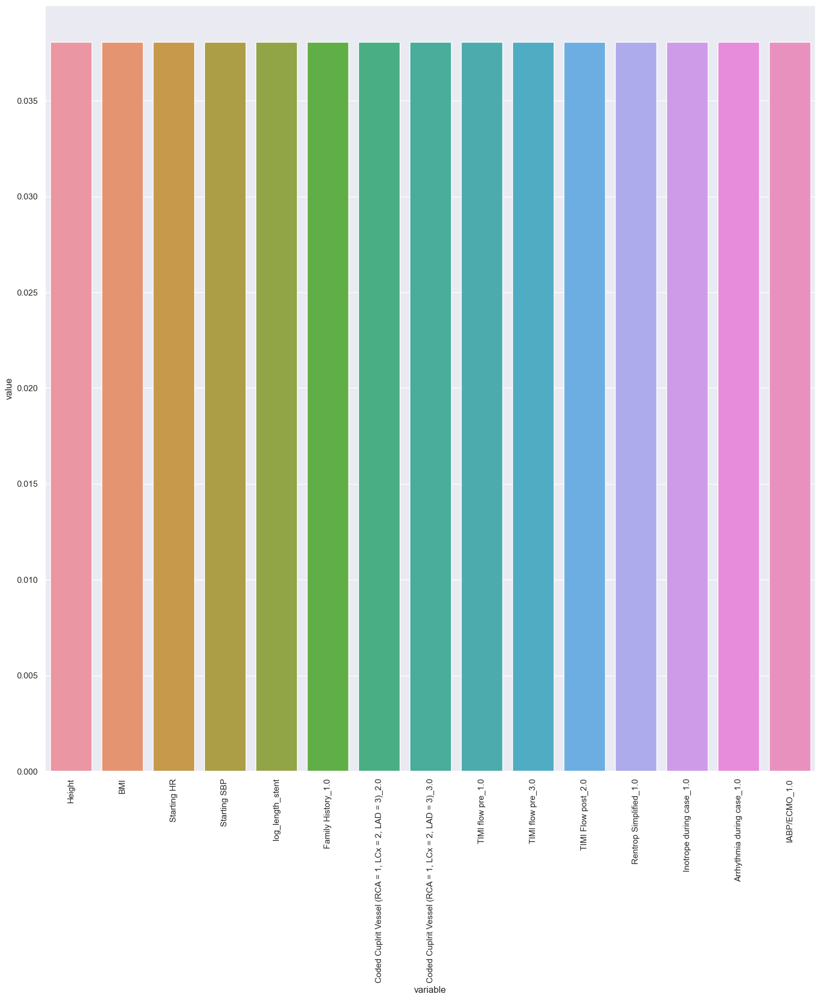

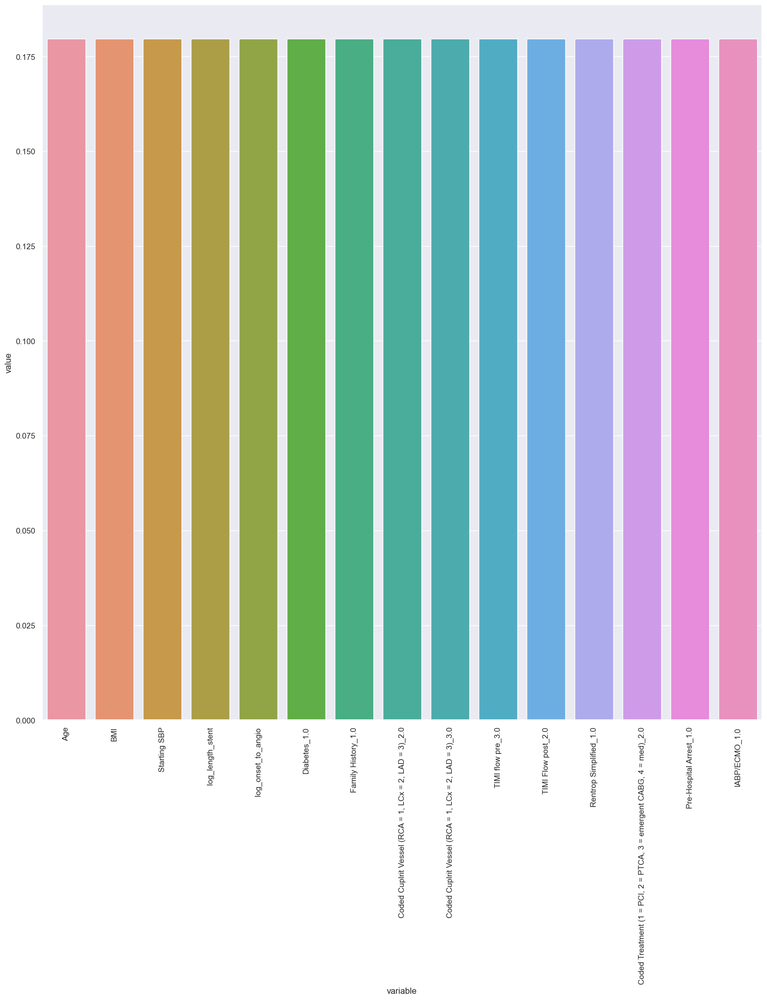

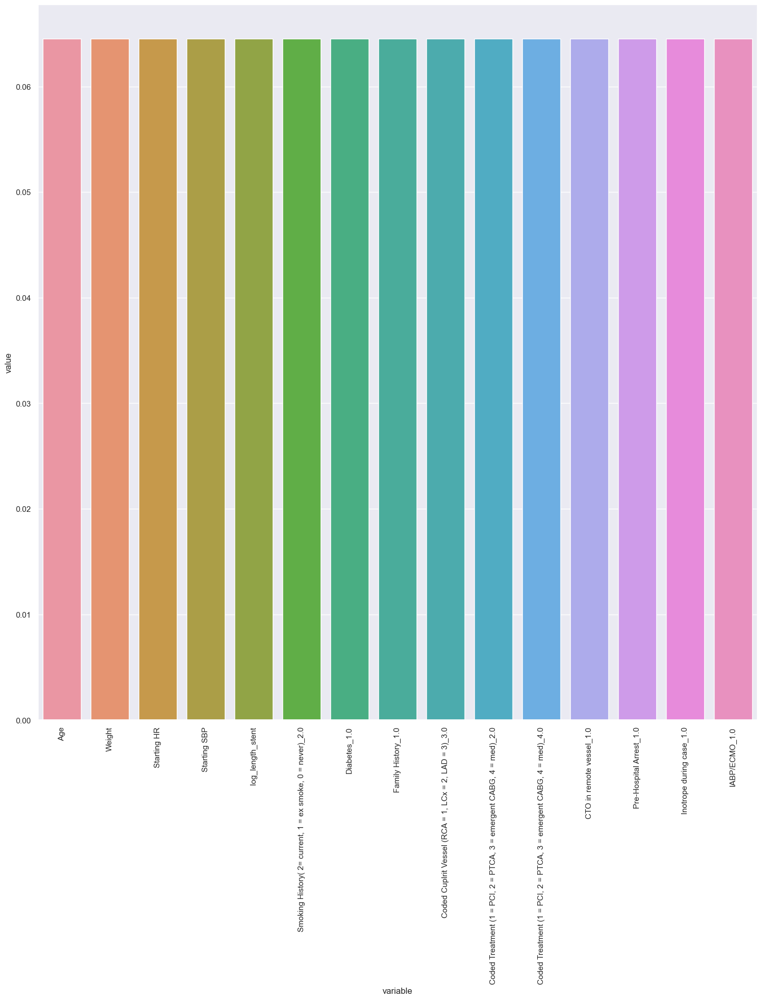

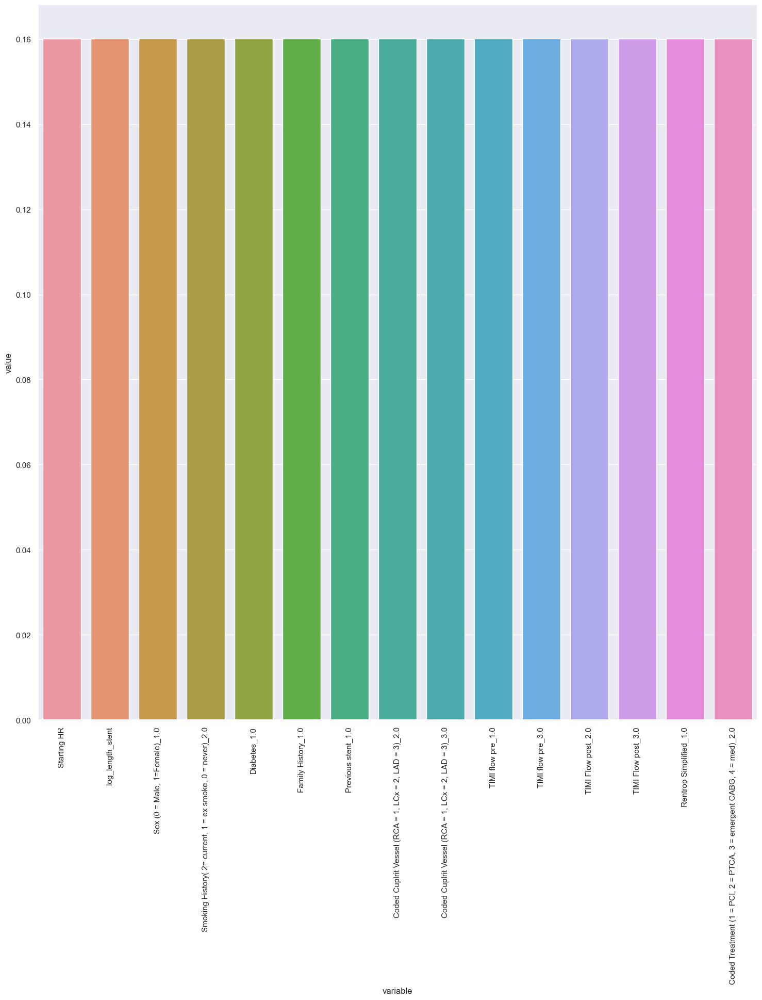

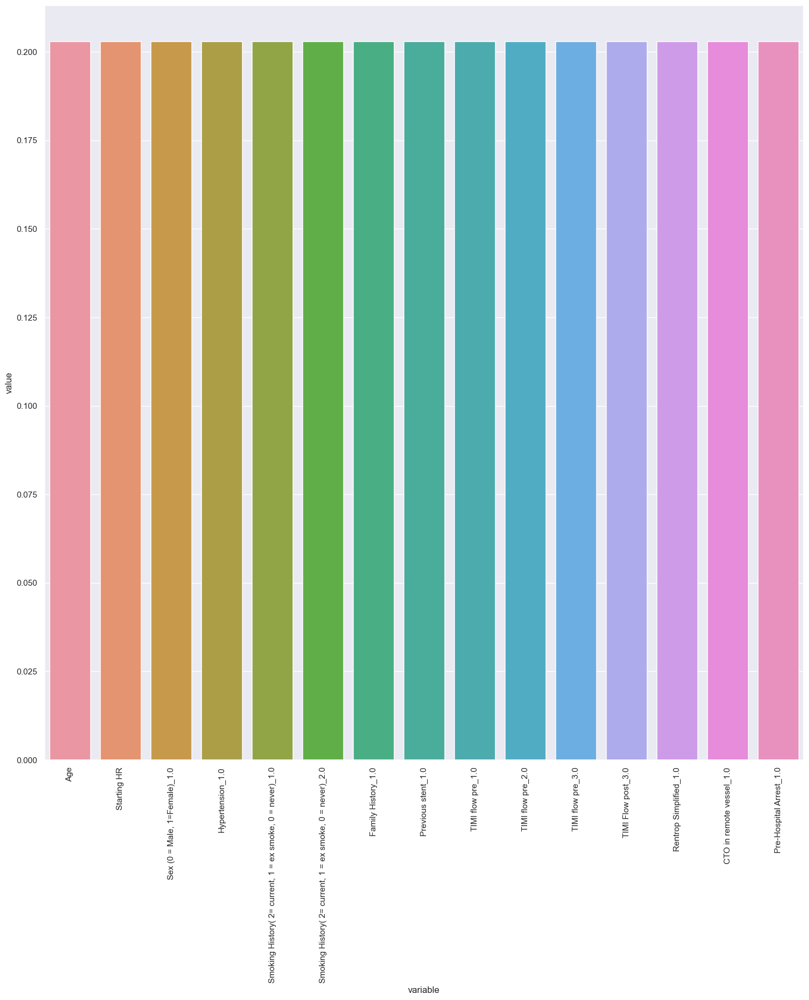

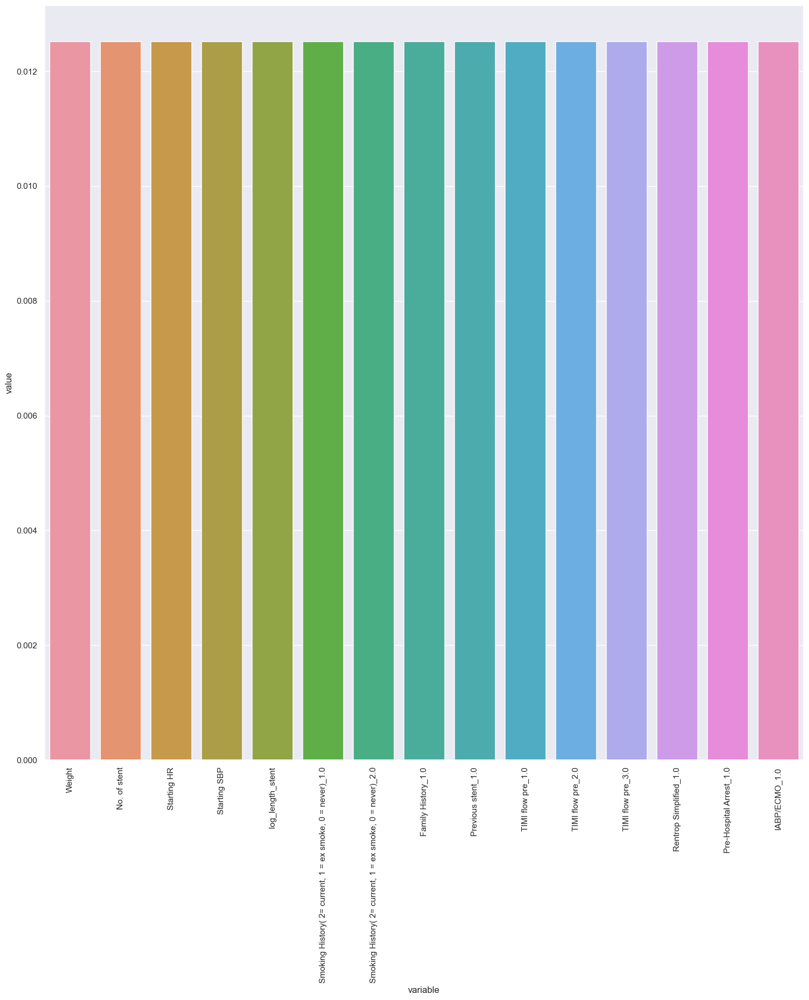

In [98]:
for use_oversample in [False,True]:
    if use_oversample:
        model_name = "rf_feature_selection" + "_oversample"
    else:
        model_name = "rf_feature_selection"
    for p in predictors:
        loaded_pipe = joblib.load("model/" + model_name + "_" + p +".pickle")
        feature_select =  loaded_pipe.named_steps["feature_select"].get_support()
        coefs = loaded_pipe.named_steps["model"].feature_importances_

        coef_df = pd.DataFrame(data = {'variable' : X_train.columns[feature_select],
                              'value' : coefs[0],
                               'mag':   coefs[0]    })

        coef_df = coef_df.sort_values('value', ascending=False)
        plt.figure(figsize=(18, 18))
        sns.barplot(
            data=coef_df, x="variable", y="value")
        ax = plt.gca()
        plt.setp(ax.get_xticklabels(), rotation=90)
        plt.savefig("figure/" + model_name + "_coeff_" + p +".png",bbox_inches="tight")

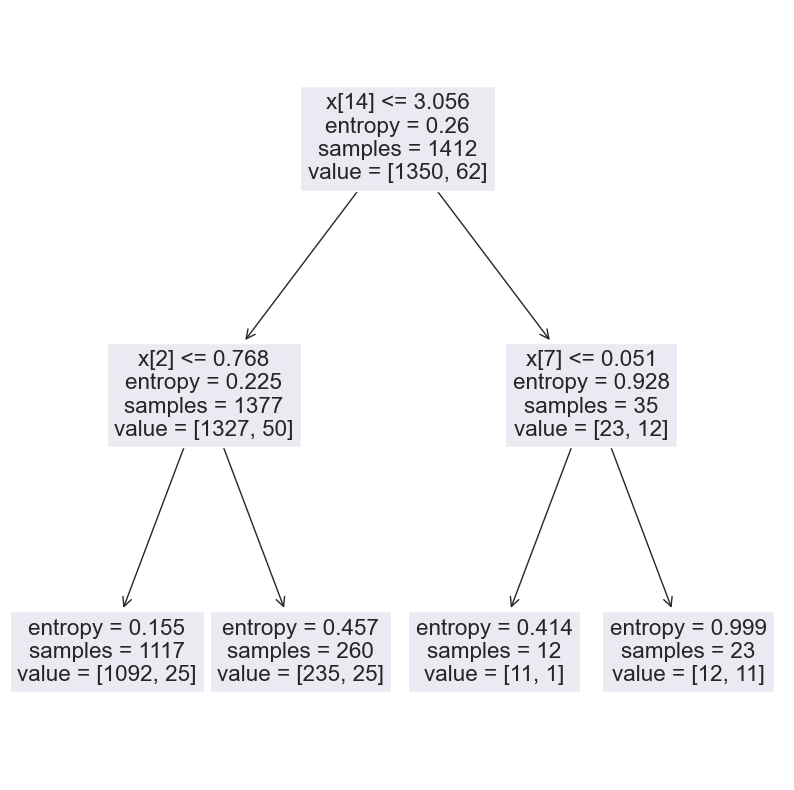

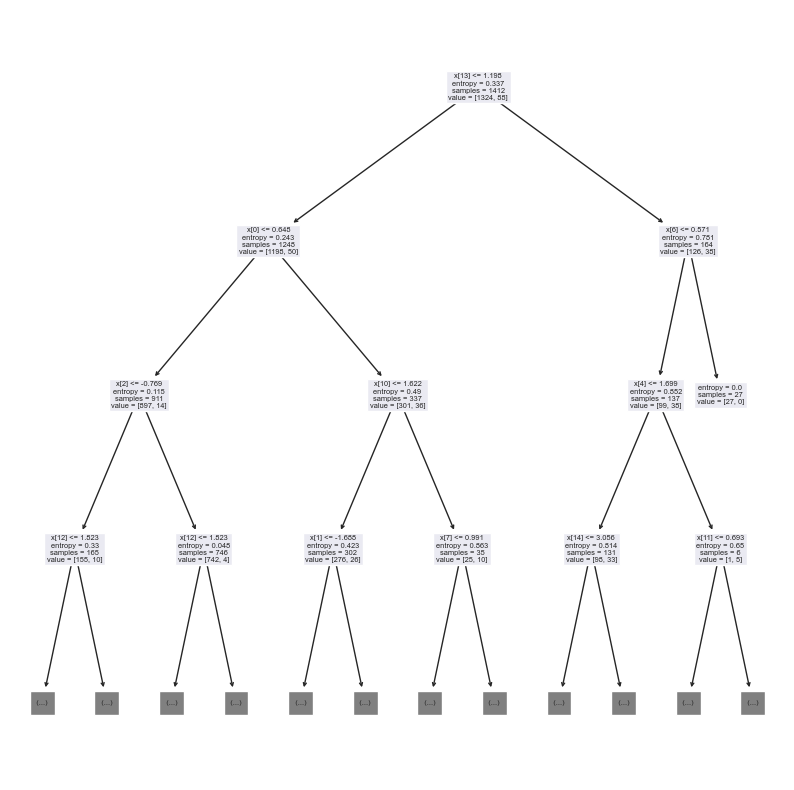

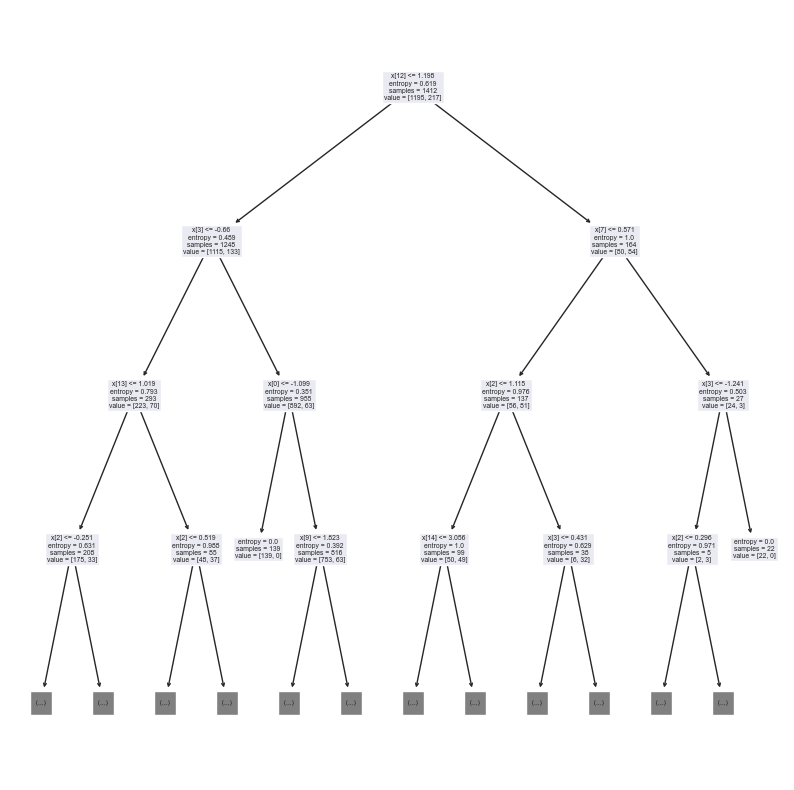

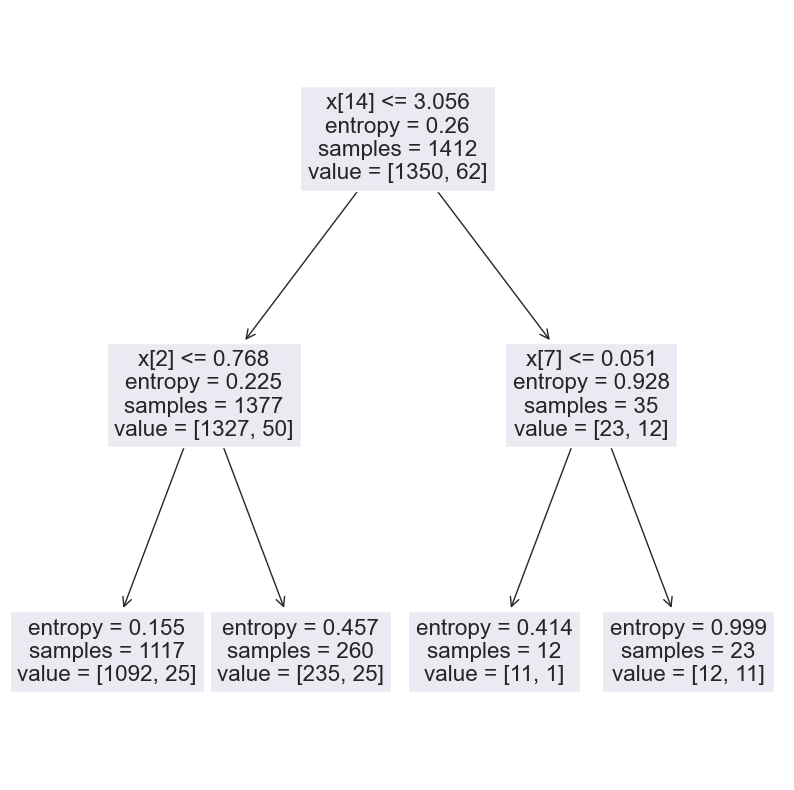

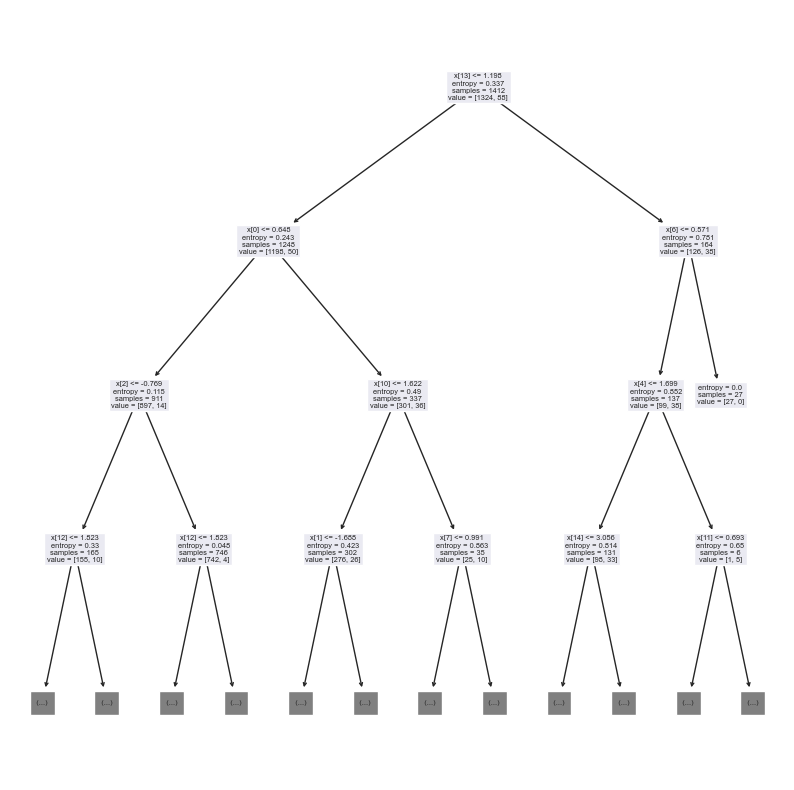

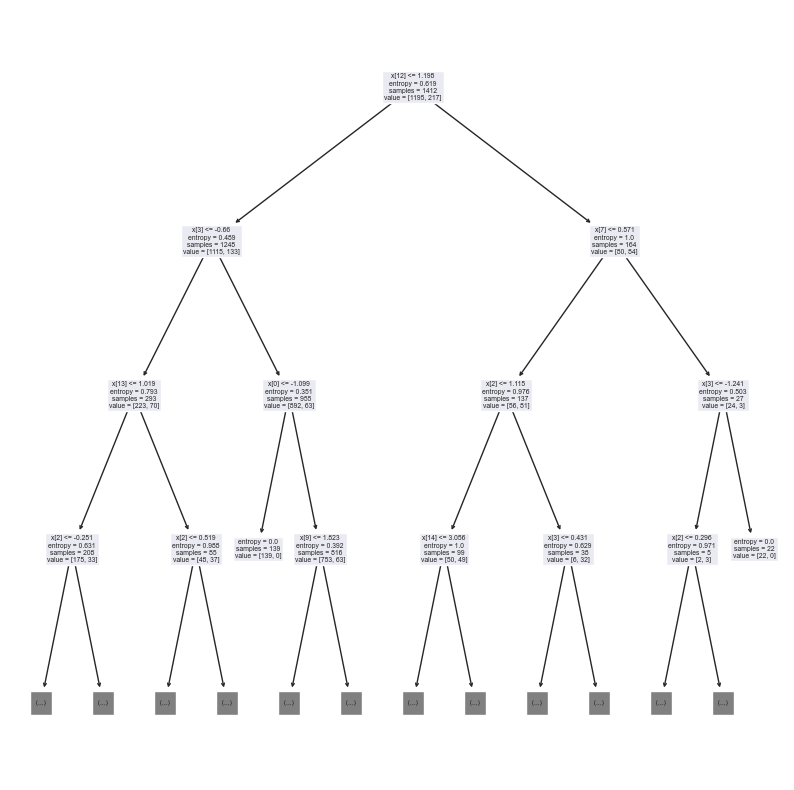

In [88]:
from sklearn.tree import plot_tree
for use_oversample in [False,True]:
    if use_oversample:
        model_name = "decision_feature_selection" + "_oversample"
    else:
        model_name = "decision_feature_selection"
    for p in predictors:
        loaded_pipe = joblib.load("model/" + model_name + "_" + p +".pickle")
        plt.figure(figsize=(10, 10))
        plot_tree(loaded_pipe.named_steps["model"],max_depth =3)
        plt.savefig("figure/" + model_name + "_tree_" + p +".png",bbox_inches="tight")

In [67]:
score_df

,model,test_accuracy,outcome,fit_time,score_time,test_precision,test_recall,test_f1,test_roc_auc
0,lr_baseline,0.958829,lvef_abnormal,0.017805,0.010602,0.613333,0.161538,0.240610,0.715484
1,lr_baseline,0.930872,In-Hospital Mortality,0.017404,0.010002,0.491429,0.250000,0.321319,0.854388
2,lr_baseline,0.869202,ICU admission,0.013803,0.010402,0.682736,0.366667,0.475193,0.822408
3,logistic_feature_selection5_oversample,0.769048,lvef_abnormal,3.837110,0.009802,0.079083,0.407692,0.132289,0.630730
4,logistic_feature_selection5_oversample,0.779866,In-Hospital Mortality,3.743333,0.010401,0.191968,0.710000,0.301497,0.827626
...,...,...,...,...,...,...,...,...,...
416,decision_feature_selection20_oversample,0.738325,lvef_abnormal,0.721961,0.026406,0.400643,0.609135,0.481788,0.765432
417,decision_feature_selection25,0.801116,lvef_abnormal,0.237453,0.024406,0.600000,0.013854,0.027010,0.788950
418,decision_feature_selection25_oversample,0.730647,lvef_abnormal,0.718360,0.025206,0.393898,0.629885,0.483646,0.765059
419,decision_feature_selection30,0.810187,lvef_abnormal,0.277973,0.027206,0.850000,0.069208,0.127449,0.783923


In [66]:
score_df.to_csv(cv_result_filename)
test_df.to_csv(test_result_filename)

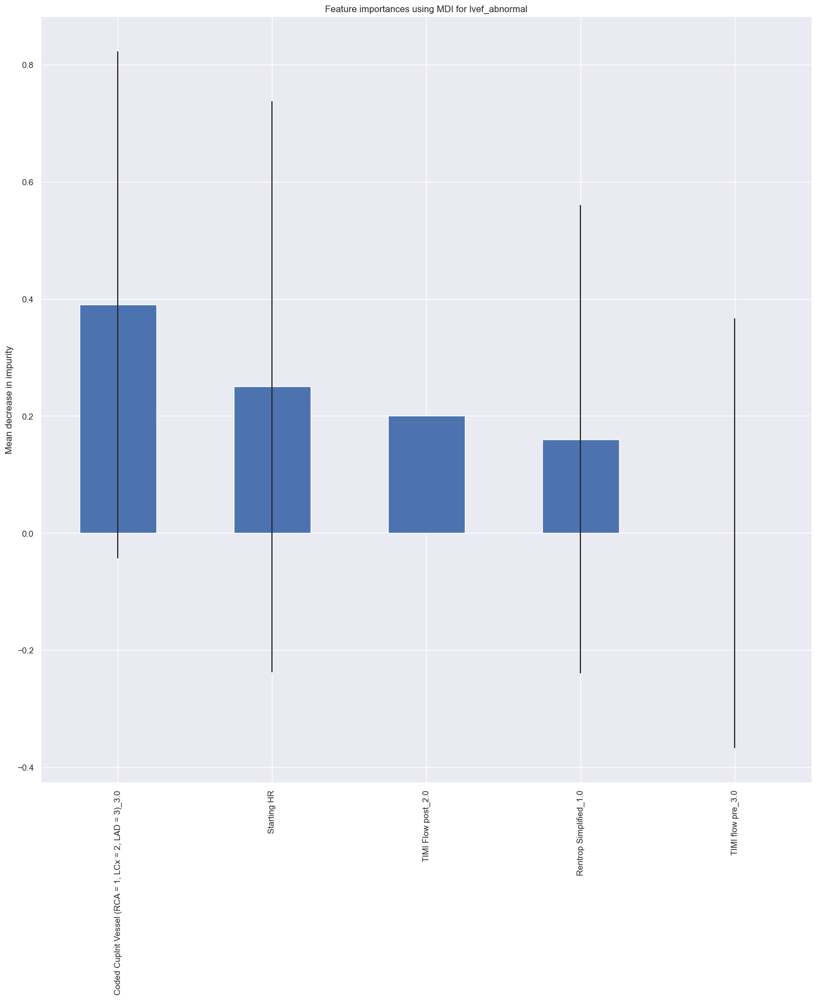

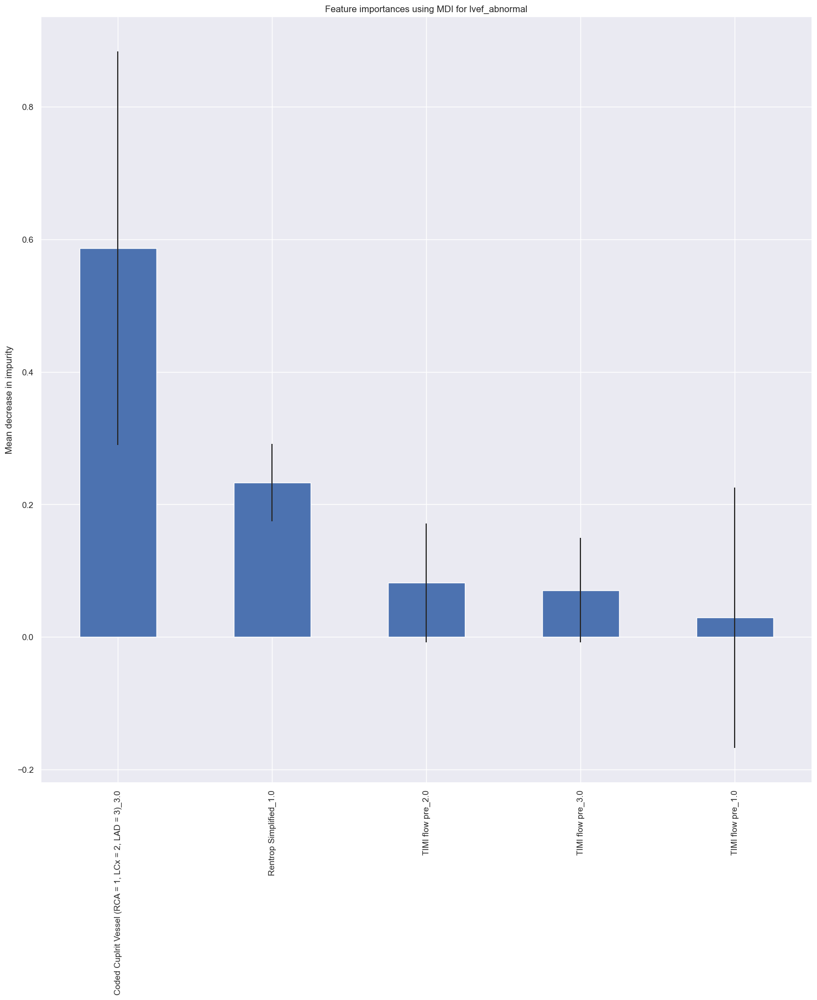

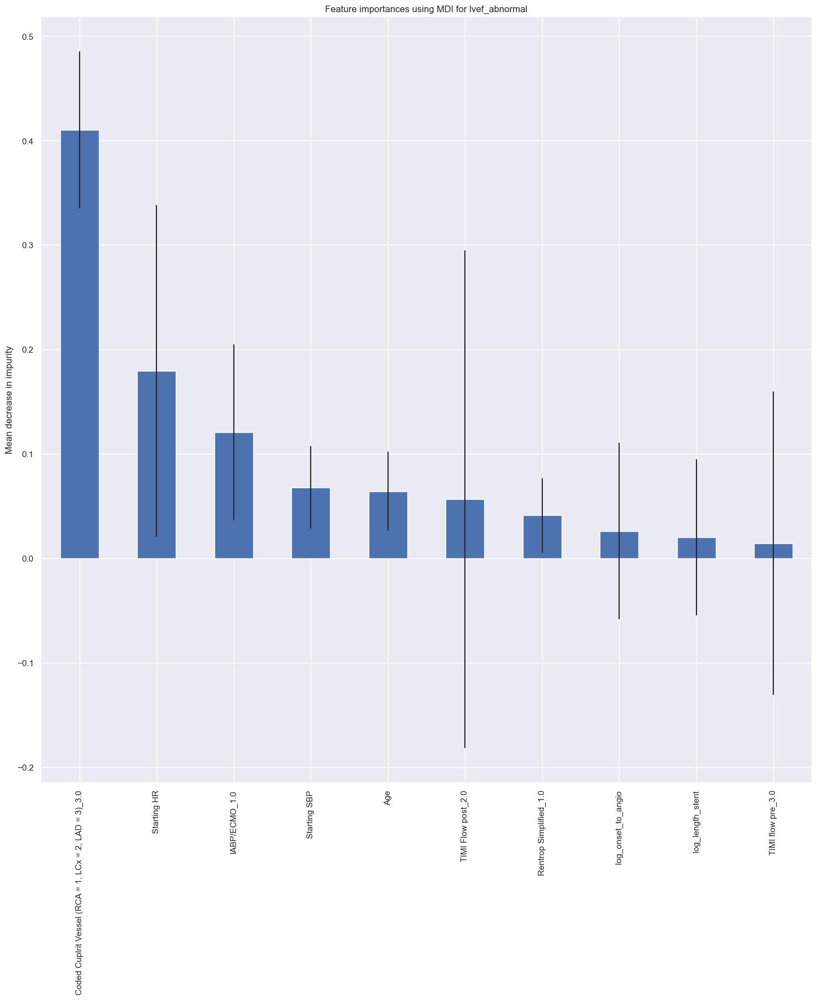

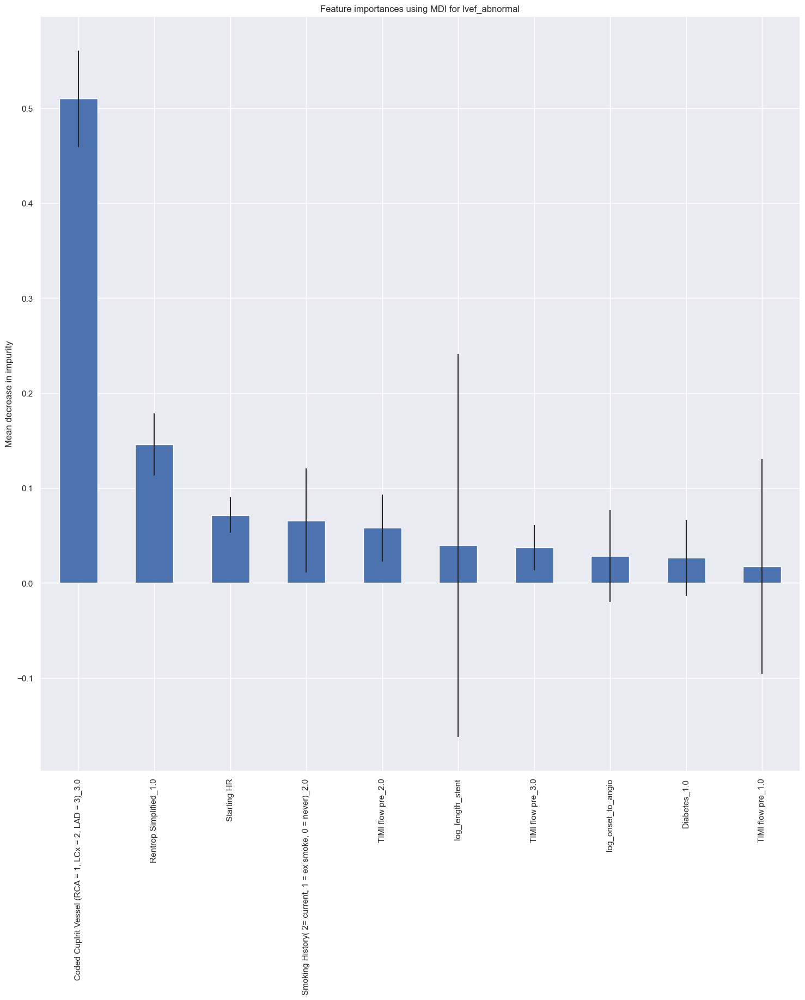

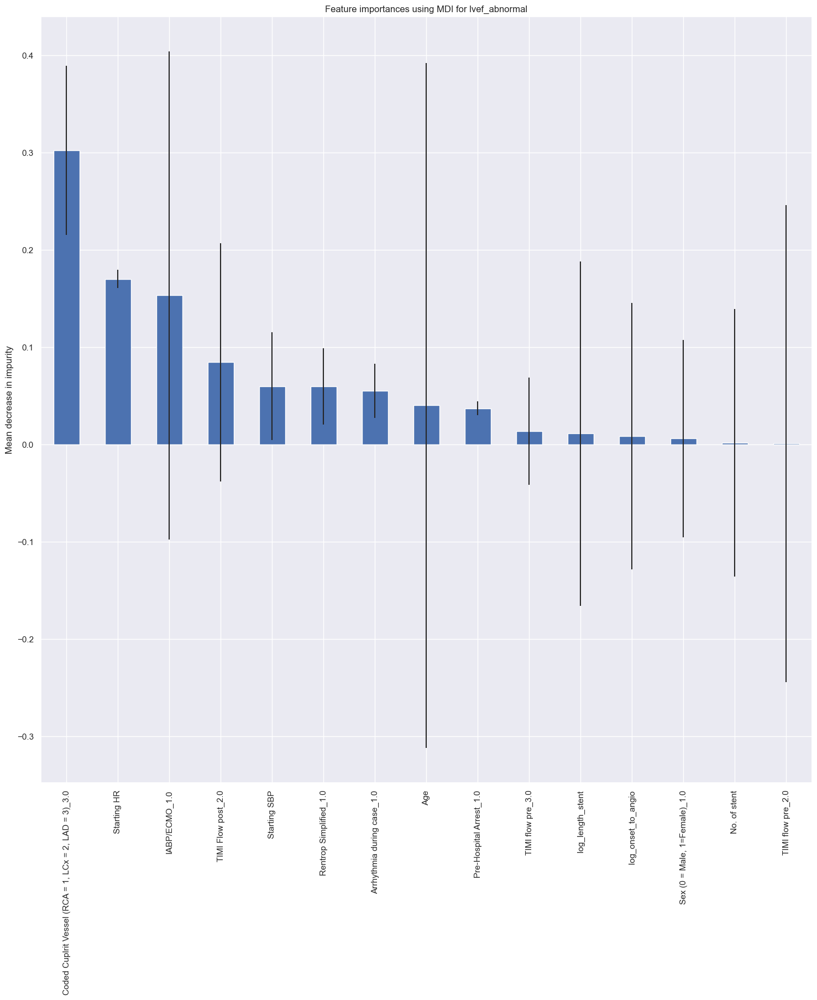

...

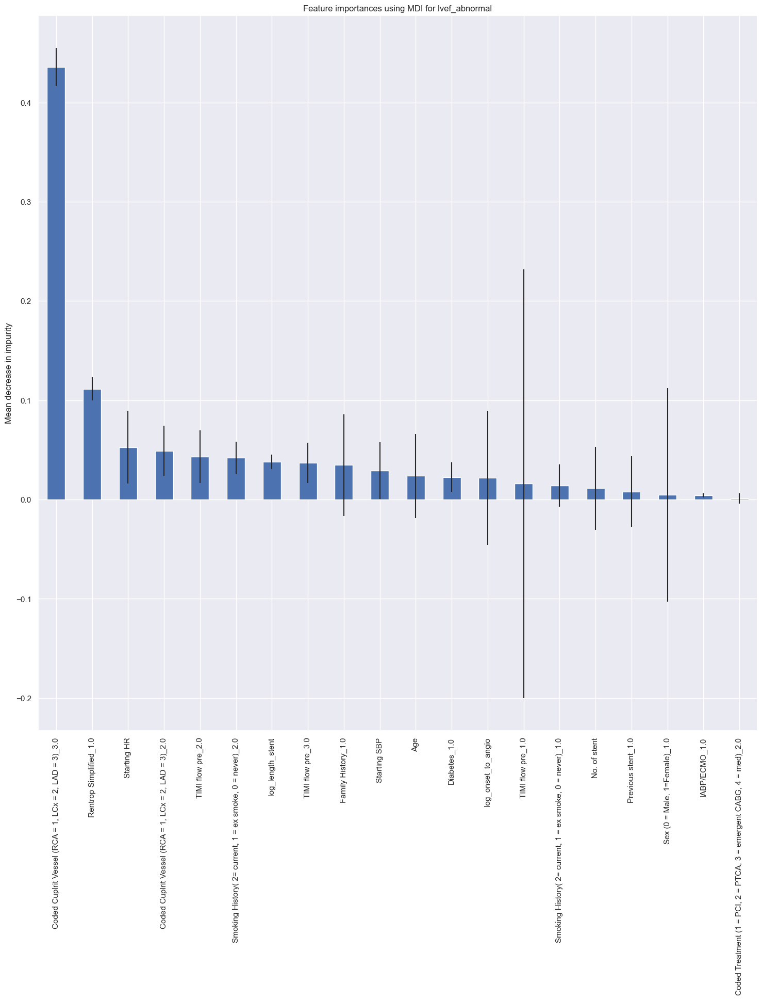

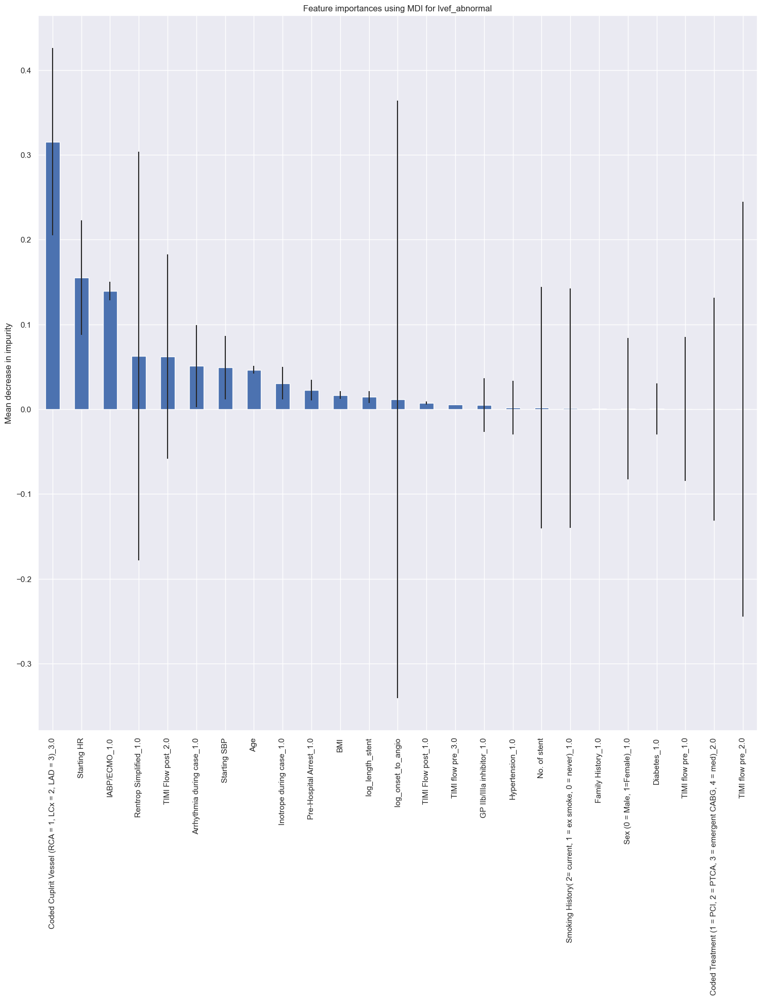

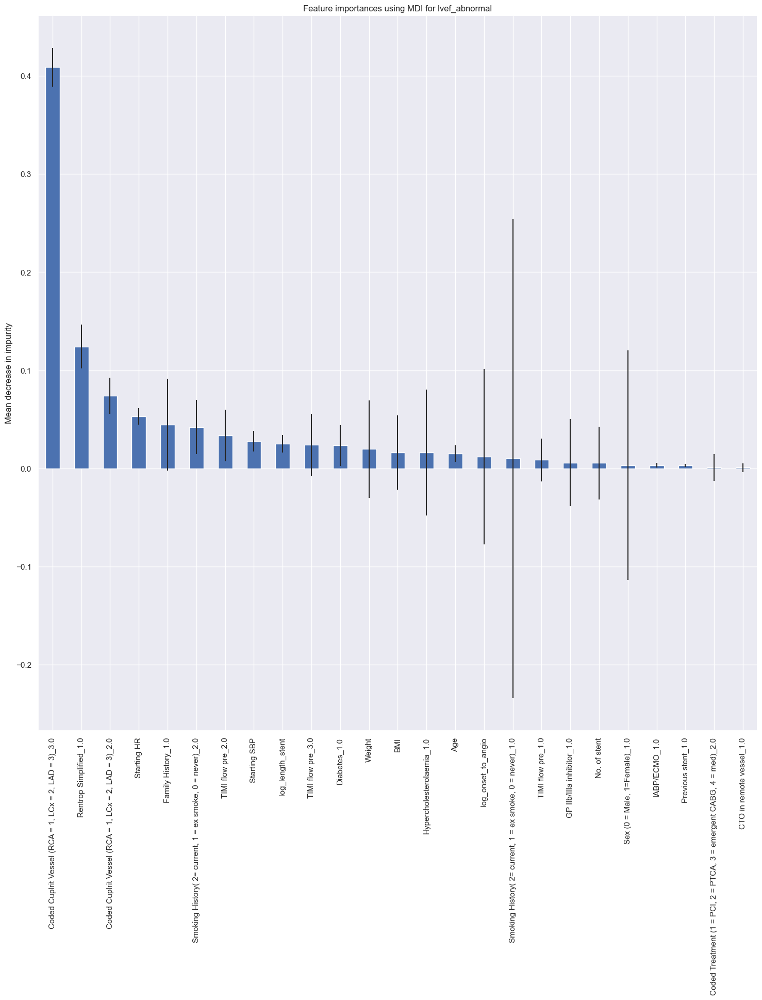

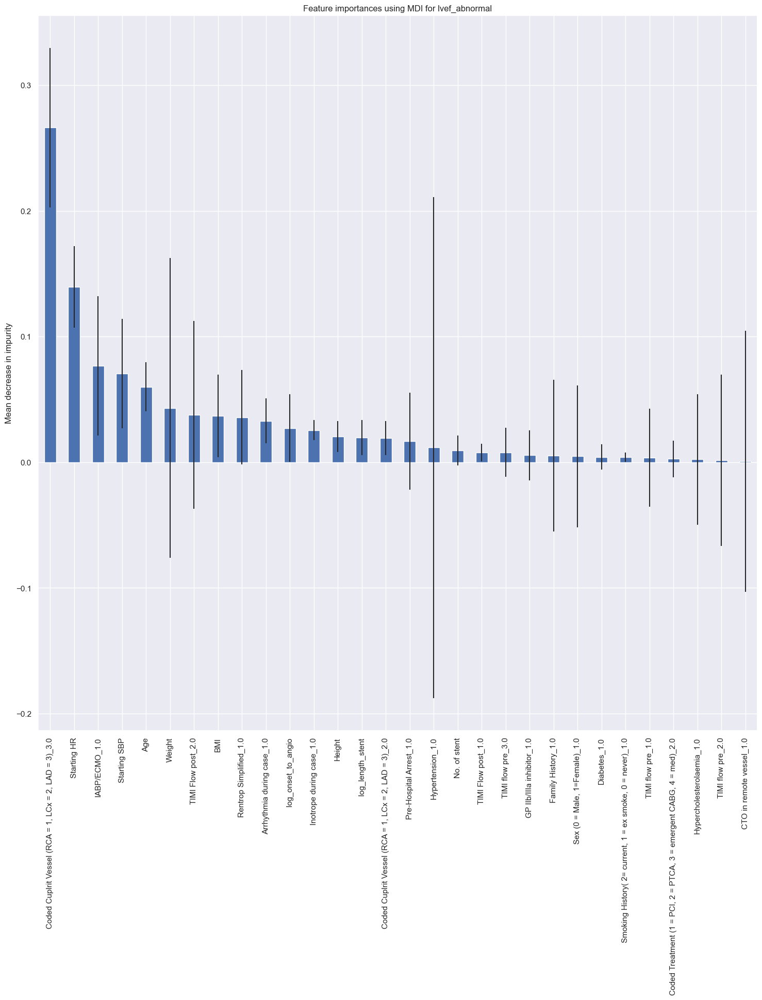

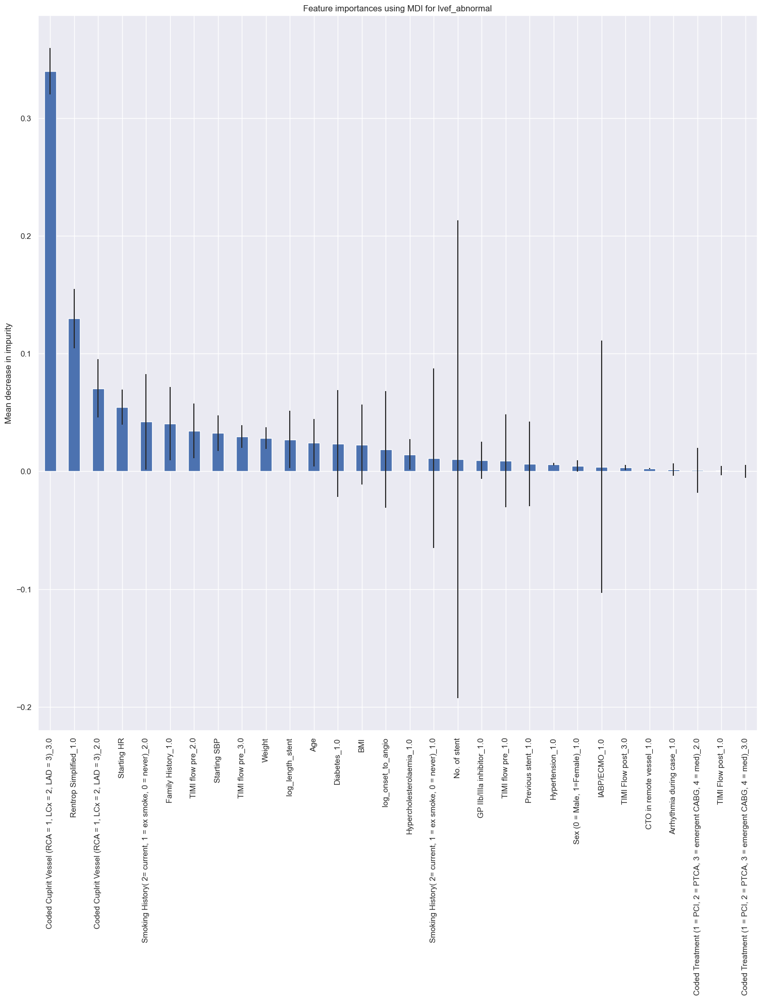

In [71]:
for n in n_features:
    for use_oversample in [False,True]:
        for p in predictors:
            if use_oversample:
                model_name = "decision_feature_selection" + str(n) +  "_oversample"
            else:
                model_name = "decision_feature_selection"  + str(n)
            loaded_pipe = joblib.load("model/" + model_name + "_" + p +".pickle")
            feature_select = loaded_pipe.named_steps["feature_select"].get_support()

            importances = loaded_pipe.named_steps["model"].feature_importances_
            std = np.std([tree.feature_importances_ for tree in loaded_pipe.named_steps["model"].estimators_], axis=0)


            forest_importances = pd.Series(importances, index= X_train.columns[feature_select])
            forest_importances = forest_importances.sort_values(ascending=False)
            fig, ax = plt.subplots(figsize=(18, 18))
            forest_importances.plot.bar(yerr=std, ax=ax)
            ax.set_title("Feature importances using MDI for " + p)
            ax.set_ylabel("Mean decrease in impurity")
            fig.tight_layout

            plt.savefig("figure/" + model_name + "_coeff_" + p +".png",bbox_inches="tight")

# Test result

In [122]:
final_result_df = pd.DataFrame.from_dict(
    {'model': [],
    'accuracy':[],
     'precision':[],
     'recall':[],
     'f1_score':[],
     'auc':[],
     'outcome':[],
    'oversample':[],
    'n_feature':[]})



In [123]:
model_dict = {
    'ada':'adaboost',
    'gb': 'gb',
    'svm':'svm',
    'rf':'rf',
    'dt':'decision',
    'l1':'l1',
    'l2':'l2',
    'elasticnet':'elasticnet',
    'logistic':'logistic'
}

In [124]:
for k,v in model_dict.items():
    for p in predictors:
        for n in n_features:
            for use_oversample in [True]:
                if use_oversample:
                    model_name = v + '_feature_selection'+str(n)+'_oversample'
                else:
                    model_name = v + '_feature_selection'+str(n)
                y_test = df_dummy.loc[test[p],p]
                X_test = df_dummy.iloc[test[p]].drop(predictors, axis=1)
                pipe = joblib.load("model/" + model_name + "_" + p +".pickle")
                test_result_df = evaluate_model(pipe,X_test,y_test)
                test_result_df["outcome"] = p
                test_result_df["model"] = k
                test_result_df["oversample"] = use_oversample
                test_result_df["n_feature"] = n

                final_result_df = pd.concat([final_result_df,test_result_df],ignore_index=True)

In [125]:
final_result_df

,model,accuracy,precision,recall,f1_score,auc,outcome,oversample,n_feature
0,ada,0.704735,0.412698,0.619048,0.495238,0.726623,lvef_abnormal,1.0,5.0
1,ada,0.752089,0.477064,0.619048,0.538860,0.759394,lvef_abnormal,True,10.0
2,ada,0.740947,0.459459,0.607143,0.523077,0.754740,lvef_abnormal,True,15.0
3,ada,0.740947,0.460177,0.619048,0.527919,0.759762,lvef_abnormal,True,20.0
4,ada,0.754875,0.481481,0.619048,0.541667,0.764394,lvef_abnormal,True,25.0
...,...,...,...,...,...,...,...,...,...
157,logistic,0.741848,0.316239,0.711538,0.437870,0.809579,ICU admission,True,10.0
158,logistic,0.777174,0.350000,0.673077,0.460526,0.805075,ICU admission,True,15.0
159,logistic,0.777174,0.346939,0.653846,0.453333,0.792661,ICU admission,True,20.0
160,logistic,0.793478,0.372340,0.673077,0.479452,0.790348,ICU admission,True,25.0


In [126]:
final_result_df.to_csv("result/final_out.csv",index=False)